In [ ]:
#Importing the train data 
from google.colab import files
files.upload()

Saving Preprocessed_train .csv to Preprocessed_train .csv


{'Preprocessed_train .csv': b',existence expectancy index,existence expectancy at birth,Gross income per capita,Income Index,Expected years of education (galactic years),Mean years of education (galactic years),Intergalactic Development Index (IDI),Education Index,"Intergalactic Development Index (IDI), Rank",Population using at least basic drinking-water services (%),Population using at least basic sanitation services (%),Gross capital formation (% of GGP),"Population, total (millions)","Population, urban (%)","Mortality rate, under-five (per 1,000 live births)","Mortality rate, infant (per 1,000 live births)",Old age dependency ratio (old age (65 and older) per 100 creatures (ages 15-64)),"Population, ages 15\xe2\x80\x9364 (millions)","Population, ages 65 and older (millions)","Life expectancy at birth, male (galactic years)","Life expectancy at birth, female (galactic years)","Population, under age 5 (millions)",Young age (0-14) dependency ratio (per 100 creatures ages 15-64),"Adole

In [ ]:
#Importing the test data
from google.colab import files
files.upload()

Saving Preprocessed_test.csv to Preprocessed_test.csv


{'Preprocessed_test.csv': b',existence expectancy index,existence expectancy at birth,Gross income per capita,Income Index,Expected years of education (galactic years),Mean years of education (galactic years),Intergalactic Development Index (IDI),Education Index,"Intergalactic Development Index (IDI), Rank",Population using at least basic drinking-water services (%),Population using at least basic sanitation services (%),Gross capital formation (% of GGP),"Population, total (millions)","Population, urban (%)","Mortality rate, under-five (per 1,000 live births)","Mortality rate, infant (per 1,000 live births)",Old age dependency ratio (old age (65 and older) per 100 creatures (ages 15-64)),"Population, ages 15\xe2\x80\x9364 (millions)","Population, ages 65 and older (millions)","Life expectancy at birth, male (galactic years)","Life expectancy at birth, female (galactic years)","Population, under age 5 (millions)",Young age (0-14) dependency ratio (per 100 creatures ages 15-64),"Adolesc

In [ ]:
!pip install catboost

     |████████████████████████████████| 64.8MB 60kB/s 


In [ ]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Created wheel for pandas-profiling: filename=pandas_profiling-2.8.0-py2.py3-none-any.whl size=259932 sha256=a012a098a3750791b53252408202a1c86ca510df47edd17ae258876e6469c269
  Stored in directory: /tmp/pip-ephem-wheel-cache-vk708xhh/wheels/56/c2/dd/8d945b0443c35df7d5f62fa9e9ae105a2d8b286302b92e0109
Successfully built pandas-profiling


Steps

1.   Problem Statement
2.   Importing Packages and Loading Data
1.   Explorartory Data Analysis
2.   Data Cleaning
1.   Applying PCA
2.   Modeling 
1.   Fine tuning parameters and deciding the final model
2.   Submit results









**Problem Statement**

1.   **To predict composite index for measurement of well being**
2.   **Optimal Energy Allocation to each galaxy and what rank is assigned to them**



In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import scatter_matrix
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from collections import Counter
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import IsolationForest
from sklearn import metrics
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from pandas_profiling import ProfileReport
from sklearn.pipeline import FeatureUnion
from sklearn.preprocessing import PowerTransformer
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor
from lightgbm import LGBMRegressor
from keras import models
from keras import layers
import tensorflow as tf
from keras import regularizers
%matplotlib inline

In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [ ]:
df = pd.read_csv("train.csv")
print("The shape of data is {}".format(df.shape))

The shape of data is (3865, 80)


In [ ]:
df.head()

,galactic year,galaxy,existence expectancy index,existence expectancy at birth,Gross income per capita,Income Index,Expected years of education (galactic years),Mean years of education (galactic years),Intergalactic Development Index (IDI),Education Index,"Intergalactic Development Index (IDI), Rank",Population using at least basic drinking-water services (%),Population using at least basic sanitation services (%),Gross capital formation (% of GGP),"Population, total (millions)","Population, urban (%)","Mortality rate, under-five (per 1,000 live births)","Mortality rate, infant (per 1,000 live births)",Old age dependency ratio (old age (65 and older) per 100 creatures (ages 15-64)),"Population, ages 15–64 (millions)","Population, ages 65 and older (millions)","Life expectancy at birth, male (galactic years)","Life expectancy at birth, female (galactic years)","Population, under age 5 (millions)",Young age (0-14) dependency ratio (per 100 creatures ages 15-64),"Adolescent birth rate (births per 1,000 female creatures ages 15-19)",Total unemployment rate (female to male ratio),Vulnerable employment (% of total employment),"Unemployment, total (% of labour force)",Employment in agriculture (% of total employment),Labour force participation rate (% ages 15 and older),"Labour force participation rate (% ages 15 and older), female",Employment in services (% of total employment),"Labour force participation rate (% ages 15 and older), male",Employment to population ratio (% ages 15 and older),Jungle area (% of total land area),"Share of employment in nonagriculture, female (% of total employment in nonagriculture)",Youth unemployment rate (female to male ratio),"Unemployment, youth (% ages 15–24)","Mortality rate, female grown up (per 1,000 people)","Mortality rate, male grown up (per 1,000 people)","Infants lacking immunization, red hot disease (% of one-galactic year-olds)","Infants lacking immunization, Combination Vaccine (% of one-galactic year-olds)",Gross galactic product (GGP) per capita,"Gross galactic product (GGP), total","Outer Galaxies direct investment, net inflows (% of GGP)",Exports and imports (% of GGP),Share of seats in senate (% held by female),Natural resource depletion,"Mean years of education, female (galactic years)","Mean years of education, male (galactic years)","Expected years of education, female (galactic years)","Expected years of education, male (galactic years)","Maternal mortality ratio (deaths per 100,000 live births)",Renewable energy consumption (% of total final energy consumption),"Estimated gross galactic income per capita, male","Estimated gross galactic income per capita, female",Rural population with access to electricity (%),Domestic credit provided by financial sector (% of GGP),"Population with at least some secondary education, female (% ages 25 and older)","Population with at least some secondary education, male (% ages 25 and older)",Gross fixed capital formation (% of GGP),"Remittances, inflows (% of GGP)",Population with at least some secondary education (% ages 25 and older),Intergalactic inbound tourists (thousands),"Gross enrolment ratio, primary (% of primary under-age population)","Respiratory disease incidence (per 100,000 people)",Interstellar phone subscriptions (per 100 people),"Interstellar Data Net users, total (% of population)",Current health expenditure (% of GGP),"Intergalactic Development Index (IDI), female","Intergalactic Development Index (IDI), male",Gender Development Index (GDI),"Intergalactic Development Index (IDI), female, Rank","Intergalactic Development Index (IDI), male, Rank",Adjusted net savings,"Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total",Private galaxy capital flows (% of GGP),Gender Inequality Index (GII),y
0,990025,Large Magellanic Cloud (LMC),0.628657,63.125200,27109.234310,0.646039,8.240543,NaN,NaN,NaN,NaN,NaN,NaN,38.305483,681.841086,22.131436,150.259290,129.841789,12.403812,490.446400,60.121580,57.028183,69.825369,46

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3865 entries, 0 to 3864
Data columns (total 80 columns):
 #   Column                                                                                   Non-Null Count  Dtype  
---  ------                                                                                   --------------  -----  
 0   galactic year                                                                            3865 non-null   int64  
 1   galaxy                                                                                   3865 non-null   object 
 2   existence expectancy index                                                               3864 non-null   float64
 3   existence expectancy at birth                                                            3864 non-null   float64
 4   Gross income per capita                                                                  3837 non-null   float64
 5   Income Index                                                  

In [ ]:
df.describe()

,galactic year,existence expectancy index,existence expectancy at birth,Gross income per capita,Income Index,Expected years of education (galactic years),Mean years of education (galactic years),Intergalactic Development Index (IDI),Education Index,"Intergalactic Development Index (IDI), Rank",Population using at least basic drinking-water services (%),Population using at least basic sanitation services (%),Gross capital formation (% of GGP),"Population, total (millions)","Population, urban (%)","Mortality rate, under-five (per 1,000 live births)","Mortality rate, infant (per 1,000 live births)",Old age dependency ratio (old age (65 and older) per 100 creatures (ages 15-64)),"Population, ages 15–64 (millions)","Population, ages 65 and older (millions)","Life expectancy at birth, male (galactic years)","Life expectancy at birth, female (galactic years)","Population, under age 5 (millions)",Young age (0-14) dependency ratio (per 100 creatures ages 15-64),"Adolescent birth rate (births per 1,000 female creatures ages 15-19)",Total unemployment rate (female to male ratio),Vulnerable employment (% of total employment),"Unemployment, total (% of labour force)",Employment in agriculture (% of total employment),Labour force participation rate (% ages 15 and older),"Labour force participation rate (% ages 15 and older), female",Employment in services (% of total employment),"Labour force participation rate (% ages 15 and older), male",Employment to population ratio (% ages 15 and older),Jungle area (% of total land area),"Share of employment in nonagriculture, female (% of total employment in nonagriculture)",Youth unemployment rate (female to male ratio),"Unemployment, youth (% ages 15–24)","Mortality rate, female grown up (per 1,000 people)","Mortality rate, male grown up (per 1,000 people)","Infants lacking immunization, red hot disease (% of one-galactic year-olds)","Infants lacking immunization, Combination Vaccine (% of one-galactic year-olds)",Gross galactic product (GGP) per capita,"Gross galactic product (GGP), total","Outer Galaxies direct investment, net inflows (% of GGP)",Exports and imports (% of GGP),Share of seats in senate (% held by female),Natural resource depletion,"Mean years of education, female (galactic years)","Mean years of education, male (galactic years)","Expected years of education, female (galactic years)","Expected years of education, male (galactic years)","Maternal mortality ratio (deaths per 100,000 live births)",Renewable energy consumption (% of total final energy consumption),"Estimated gross galactic income per capita, male","Estimated gross galactic income per capita, female",Rural population with access to electricity (%),Domestic credit provided by financial sector (% of GGP),"Population with at least some secondary education, female (% ages 25 and older)","Population with at least some secondary education, male (% ages 25 and older)",Gross fixed capital formation (% of GGP),"Remittances, inflows (% of GGP)",Population with at least some secondary education (% ages 25 and older),Intergalactic inbound tourists (thousands),"Gross enrolment ratio, primary (% of primary under-age population)","Respiratory disease incidence (per 100,000 people)",Interstellar phone subscriptions (per 100 people),"Interstellar Data Net users, total (% of population)",Current health expenditure (% of GGP),"Intergalactic Development Index (IDI), female","Intergalactic Development Index (IDI), male",Gender Development Index (GDI),"Intergalactic Development Index (IDI), female, Rank","Intergalactic Development Index (IDI), male, Rank",Adjusted net savings,"Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total",Private galaxy capital flows (% of GGP),Gender Inequality Index (GII),y
count,3.865000e+03,3864.000000,3864.000000,3837.000000,3837.000000,3732.000000,3502.000000,3474.000000,3474.000000,3432.000000,2021.000000,2015.000000,1502.000000,1271.000000,1271.000000,1271.000000,1259.000000,1264.000000,12

**DATA PREPROCESING STEPS**
1.  **All index values need to be btw 0 and 1 and all % need to be 0 and 100**

2.  **Following Columns which have negative values but cannot be**
*   Population,total(millions)
*   Population, ages 15–64 (millions)
*   Population, ages 65 and older (millions)
*   Population, under age 5 (millions)
*   Employment in agriculture (% of total employment)
*   Infants lacking immunization, Combination Vaccine (% of one-galactic year-olds)
*   Gross galactic product (GGP), total
*   Gross income per capita
*   Renewable energy consumption (% of total final energy consumption)
*   Natural resource depletion
*   Estimated gross galactic income per capita, female
*   Remittances, inflows (% of GGP)
*   Intergalactic inbound tourists (thousands)
*   Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total
3.   **Imputations of null values**
4.   **Outliers Removal**
5.   **Data Standardization**












*Exploratory Data Analysis*

In [ ]:
profile = ProfileReport(df, title ="Pandas Profiling Report",minimal=True)
profile.to_notebook_iframe()

In [ ]:
profile.to_file("REPORT.html")

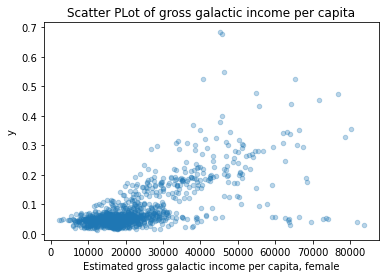

In [ ]:
df.plot(kind = "scatter",x = "Estimated gross galactic income per capita, female", y ="y",title = "Scatter PLot of gross galactic income per capita",alpha =0.3)

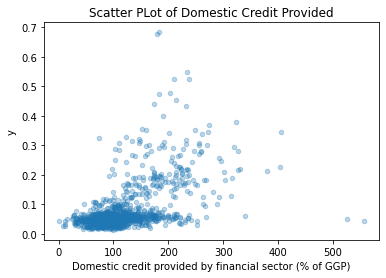

In [ ]:
df.plot(kind = "scatter",x = "Domestic credit provided by financial sector (% of GGP)", y ="y",title = "Scatter PLot of Domestic Credit Provided",alpha =0.3)

Some things to note: 

*   Some attributes have more than 80% of data missing
*   Some attributes have abnormal values such as negative values in population,income per capita,neg energy consumption etc which need to be taken care of.
*   Outliers which need to be treated

*   Feature Scaling is required since the different attributes have different scales













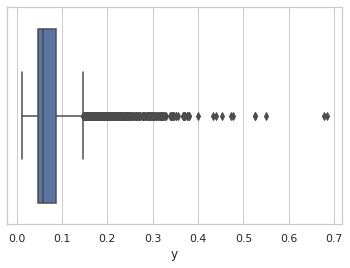

In [ ]:
#visualizing target variable
sns.set(style="whitegrid")
ax = sns.boxplot(x=df["y"])

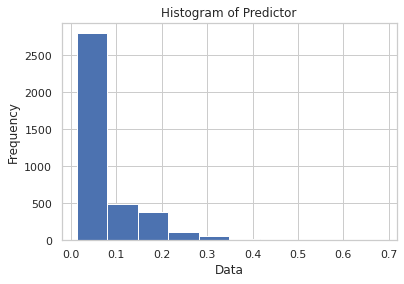

In [ ]:
plt.hist(x = df["y"])
plt.xlabel("Data")
plt.ylabel("Frequency")
plt.title("Histogram of Predictor")
plt.show()

Things to notice:

*   Most of the predictor's data is concentrated btw 0.02 and 0.2
*   The data is rightly skewed 



'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


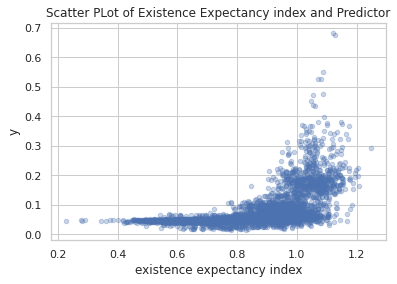

In [ ]:
df.plot(kind = "scatter",x = "existence expectancy index", y ="y",title = "Scatter PLot of Existence Expectancy index and Predictor",alpha =0.3)

Some things to note:

*   Looks like y is capped from down side as there is a line y = 0.05.This may be becuause most values are btw this range.


*   A week positive co relation btw these two indicators









In [ ]:
#finding co relation with predictors
corr_mat = df.corr()
corr_mat["y"].sort_values(ascending = False)

y                                                                                          1.000000
Old age dependency ratio (old age (65 and older) per 100 creatures (ages 15-64))           0.679981
Estimated gross galactic income per capita, female                                         0.667801
Interstellar Data Net users, total (% of population)                                       0.651823
Intergalactic Development Index (IDI)                                                      0.625114
Intergalactic Development Index (IDI), male                                                0.622699
Intergalactic Development Index (IDI), female                                              0.614971
Education Index                                                                            0.613938
Expected years of education (galactic years)                                               0.584069
Mean years of education (galactic years)                                                   0.583858


Things to note:

*  Although Gender Inequality index has only 80% null values but it has   highest  negative corealtion.Certainly we cannot drop this feature. 
* The important features with respect to predictor are    

1.   Gender Inequality Index (GII)
2.   Intergalactic Development Index (IDI), Rank

1.   Intergalactic Development Index (IDI), male, Rank 
2.   Intergalactic Development Index (IDI), female, Rank 

1.   Old age dependency ratio (old age (65 and older) per 100 creatures (ages 15-64))
2.   Estimated gross galactic income per capita, female 

1.   Interstellar Data Net users, total (% of population)
2.   Intergalactic Development Index (IDI)

1.   Intergalactic Development Index (IDI), male
2.   Intergalactic Development Index (IDI), female 

1.   Education Index

Lets visualize only promising attributes now
















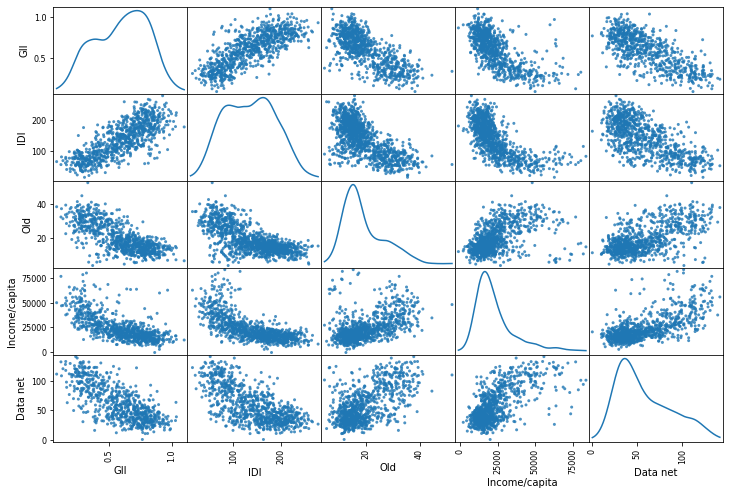

In [ ]:

df = df.rename(columns={"Gender Inequality Index (GII)": "GII", "Intergalactic Development Index (IDI), Rank": "IDI","Old age dependency ratio (old age (65 and older) per 100 creatures (ages 15-64))": "Old","Estimated gross galactic income per capita, female": "Income/capita","Interstellar Data Net users, total (% of population)": "Data net",})
attributes = ["GII","IDI","Old","Income/capita","Data net"]
scatter_matrix(df[attributes],figsize=(12,8),diagonal="kde",alpha =0.8)
plt.show()

The most prominent relation can be seen btw Intergalactic Development Index (IDI), Rank and Gender Inequality Index(GII) which can be very helpful in prediction of required composite index

**Prepairing and cleaning data**

In [ ]:
df_labels = df.drop("y",axis =1)
df_labels.head()

,galactic year,galaxy,existence expectancy index,existence expectancy at birth,Gross income per capita,Income Index,Expected years of education (galactic years),Mean years of education (galactic years),Intergalactic Development Index (IDI),Education Index,"Intergalactic Development Index (IDI), Rank",Population using at least basic drinking-water services (%),Population using at least basic sanitation services (%),Gross capital formation (% of GGP),"Population, total (millions)","Population, urban (%)","Mortality rate, under-five (per 1,000 live births)","Mortality rate, infant (per 1,000 live births)",Old age dependency ratio (old age (65 and older) per 100 creatures (ages 15-64)),"Population, ages 15–64 (millions)","Population, ages 65 and older (millions)","Life expectancy at birth, male (galactic years)","Life expectancy at birth, female (galactic years)","Population, under age 5 (millions)",Young age (0-14) dependency ratio (per 100 creatures ages 15-64),"Adolescent birth rate (births per 1,000 female creatures ages 15-19)",Total unemployment rate (female to male ratio),Vulnerable employment (% of total employment),"Unemployment, total (% of labour force)",Employment in agriculture (% of total employment),Labour force participation rate (% ages 15 and older),"Labour force participation rate (% ages 15 and older), female",Employment in services (% of total employment),"Labour force participation rate (% ages 15 and older), male",Employment to population ratio (% ages 15 and older),Jungle area (% of total land area),"Share of employment in nonagriculture, female (% of total employment in nonagriculture)",Youth unemployment rate (female to male ratio),"Unemployment, youth (% ages 15–24)","Mortality rate, female grown up (per 1,000 people)","Mortality rate, male grown up (per 1,000 people)","Infants lacking immunization, red hot disease (% of one-galactic year-olds)","Infants lacking immunization, Combination Vaccine (% of one-galactic year-olds)",Gross galactic product (GGP) per capita,"Gross galactic product (GGP), total","Outer Galaxies direct investment, net inflows (% of GGP)",Exports and imports (% of GGP),Share of seats in senate (% held by female),Natural resource depletion,"Mean years of education, female (galactic years)","Mean years of education, male (galactic years)","Expected years of education, female (galactic years)","Expected years of education, male (galactic years)","Maternal mortality ratio (deaths per 100,000 live births)",Renewable energy consumption (% of total final energy consumption),"Estimated gross galactic income per capita, male","Estimated gross galactic income per capita, female",Rural population with access to electricity (%),Domestic credit provided by financial sector (% of GGP),"Population with at least some secondary education, female (% ages 25 and older)","Population with at least some secondary education, male (% ages 25 and older)",Gross fixed capital formation (% of GGP),"Remittances, inflows (% of GGP)",Population with at least some secondary education (% ages 25 and older),Intergalactic inbound tourists (thousands),"Gross enrolment ratio, primary (% of primary under-age population)","Respiratory disease incidence (per 100,000 people)",Interstellar phone subscriptions (per 100 people),"Interstellar Data Net users, total (% of population)",Current health expenditure (% of GGP),"Intergalactic Development Index (IDI), female","Intergalactic Development Index (IDI), male",Gender Development Index (GDI),"Intergalactic Development Index (IDI), female, Rank","Intergalactic Development Index (IDI), male, Rank",Adjusted net savings,"Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total",Private galaxy capital flows (% of GGP),Gender Inequality Index (GII)
0,990025,Large Magellanic Cloud (LMC),0.628657,63.125200,27109.234310,0.646039,8.240543,NaN,NaN,NaN,NaN,NaN,NaN,38.305483,681.841086,22.131436,150.259290,129.841789,12.403812,490.446400,60.121580,57.028183,69.825369,46.0

In [ ]:
df_labels.describe()

,galactic year,existence expectancy index,existence expectancy at birth,Gross income per capita,Income Index,Expected years of education (galactic years),Mean years of education (galactic years),Intergalactic Development Index (IDI),Education Index,"Intergalactic Development Index (IDI), Rank",Population using at least basic drinking-water services (%),Population using at least basic sanitation services (%),Gross capital formation (% of GGP),"Population, total (millions)","Population, urban (%)","Mortality rate, under-five (per 1,000 live births)","Mortality rate, infant (per 1,000 live births)",Old age dependency ratio (old age (65 and older) per 100 creatures (ages 15-64)),"Population, ages 15–64 (millions)","Population, ages 65 and older (millions)","Life expectancy at birth, male (galactic years)","Life expectancy at birth, female (galactic years)","Population, under age 5 (millions)",Young age (0-14) dependency ratio (per 100 creatures ages 15-64),"Adolescent birth rate (births per 1,000 female creatures ages 15-19)",Total unemployment rate (female to male ratio),Vulnerable employment (% of total employment),"Unemployment, total (% of labour force)",Employment in agriculture (% of total employment),Labour force participation rate (% ages 15 and older),"Labour force participation rate (% ages 15 and older), female",Employment in services (% of total employment),"Labour force participation rate (% ages 15 and older), male",Employment to population ratio (% ages 15 and older),Jungle area (% of total land area),"Share of employment in nonagriculture, female (% of total employment in nonagriculture)",Youth unemployment rate (female to male ratio),"Unemployment, youth (% ages 15–24)","Mortality rate, female grown up (per 1,000 people)","Mortality rate, male grown up (per 1,000 people)","Infants lacking immunization, red hot disease (% of one-galactic year-olds)","Infants lacking immunization, Combination Vaccine (% of one-galactic year-olds)",Gross galactic product (GGP) per capita,"Gross galactic product (GGP), total","Outer Galaxies direct investment, net inflows (% of GGP)",Exports and imports (% of GGP),Share of seats in senate (% held by female),Natural resource depletion,"Mean years of education, female (galactic years)","Mean years of education, male (galactic years)","Expected years of education, female (galactic years)","Expected years of education, male (galactic years)","Maternal mortality ratio (deaths per 100,000 live births)",Renewable energy consumption (% of total final energy consumption),"Estimated gross galactic income per capita, male","Estimated gross galactic income per capita, female",Rural population with access to electricity (%),Domestic credit provided by financial sector (% of GGP),"Population with at least some secondary education, female (% ages 25 and older)","Population with at least some secondary education, male (% ages 25 and older)",Gross fixed capital formation (% of GGP),"Remittances, inflows (% of GGP)",Population with at least some secondary education (% ages 25 and older),Intergalactic inbound tourists (thousands),"Gross enrolment ratio, primary (% of primary under-age population)","Respiratory disease incidence (per 100,000 people)",Interstellar phone subscriptions (per 100 people),"Interstellar Data Net users, total (% of population)",Current health expenditure (% of GGP),"Intergalactic Development Index (IDI), female","Intergalactic Development Index (IDI), male",Gender Development Index (GDI),"Intergalactic Development Index (IDI), female, Rank","Intergalactic Development Index (IDI), male, Rank",Adjusted net savings,"Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total",Private galaxy capital flows (% of GGP),Gender Inequality Index (GII)
count,3.865000e+03,3864.000000,3864.000000,3837.000000,3837.000000,3732.000000,3502.000000,3474.000000,3474.000000,3432.000000,2021.000000,2015.000000,1502.000000,1271.000000,1271.000000,1271.000000,1259.000000,1264.000000,1264

In [ ]:
coloumn = df_labels["Gross income per capita"]
coloumn = coloumn.sort_values(ascending = False)
print(coloumn)
#df_labels["Gross income per capita"].value_counts(ascending = False)

3591    151072.683200
3057    139272.389000
2577    132861.542800
3628    130011.142000
1468    129333.319500
32      128160.286800
683     127896.636800
776     127087.962200
942     126637.407700
2316    126278.042000
1289    125757.406000
2997    125215.417300
2787    125042.899700
1106    122739.314900
2092    121839.306400
2828    121162.976300
2423    120529.890900
319     120399.562100
2827    120250.512600
1702    119831.006900
1546    119613.153900
2584    118810.932900
1384    118709.529100
1882    118691.335800
2429    118587.938500
374     117939.481800
1325    117385.663000
824     116211.812600
1791    115235.841100
1996    114378.264400
1842    112802.671300
915     112774.682700
1108    110489.044200
529     109131.988900
1888    108134.998100
2564    107549.588400
3093    107469.314200
1402    107188.100300
2582    107147.349400
2059    106737.029000
3479    106579.768400
1895    106544.191100
1461    104720.003200
2889    104436.748500
2490    103705.886300
848     10

In [ ]:
df_predictor = df.loc[:,"y"]

In [ ]:
df_predictor.shape

(3865,)

First remove abnormal values  like neg % 

In [ ]:
cols= ["Population, total (millions)","Population, ages 15–64 (millions)","Population, ages 65 and older (millions)","Population, under age 5 (millions)","Employment in agriculture (% of total employment)","Infants lacking immunization, Combination Vaccine (% of one-galactic year-olds)","Gross galactic product (GGP), total","Gross income per capita","Renewable energy consumption (% of total final energy consumption)","Natural resource depletion","Estimated gross galactic income per capita, female","Remittances, inflows (% of GGP)","Intergalactic inbound tourists (thousands)","Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total","Domestic credit provided by financial sector (% of GGP)"]
df[cols] = df[df[cols] > 0][cols]

In [ ]:
coloumn = df["Gross income per capita"]
coloumn = coloumn.sort_values(ascending = False)
print(coloumn)
#just replaced neg % with nan

3591    151072.683200
3057    139272.389000
2577    132861.542800
3628    130011.142000
1468    129333.319500
32      128160.286800
683     127896.636800
776     127087.962200
942     126637.407700
2316    126278.042000
1289    125757.406000
2997    125215.417300
2787    125042.899700
1106    122739.314900
2092    121839.306400
2828    121162.976300
2423    120529.890900
319     120399.562100
2827    120250.512600
1702    119831.006900
1546    119613.153900
2584    118810.932900
1384    118709.529100
1882    118691.335800
2429    118587.938500
374     117939.481800
1325    117385.663000
824     116211.812600
1791    115235.841100
1996    114378.264400
1842    112802.671300
915     112774.682700
1108    110489.044200
529     109131.988900
1888    108134.998100
2564    107549.588400
3093    107469.314200
1402    107188.100300
2582    107147.349400
2059    106737.029000
3479    106579.768400
1895    106544.191100
1461    104720.003200
2889    104436.748500
2490    103705.886300
848     10

In [ ]:
df.describe()

,galactic year,existence expectancy index,existence expectancy at birth,Gross income per capita,Income Index,Expected years of education (galactic years),Mean years of education (galactic years),Intergalactic Development Index (IDI),Education Index,"Intergalactic Development Index (IDI), Rank",Population using at least basic drinking-water services (%),Population using at least basic sanitation services (%),Gross capital formation (% of GGP),"Population, total (millions)","Population, urban (%)","Mortality rate, under-five (per 1,000 live births)","Mortality rate, infant (per 1,000 live births)",Old age dependency ratio (old age (65 and older) per 100 creatures (ages 15-64)),"Population, ages 15–64 (millions)","Population, ages 65 and older (millions)","Life expectancy at birth, male (galactic years)","Life expectancy at birth, female (galactic years)","Population, under age 5 (millions)",Young age (0-14) dependency ratio (per 100 creatures ages 15-64),"Adolescent birth rate (births per 1,000 female creatures ages 15-19)",Total unemployment rate (female to male ratio),Vulnerable employment (% of total employment),"Unemployment, total (% of labour force)",Employment in agriculture (% of total employment),Labour force participation rate (% ages 15 and older),"Labour force participation rate (% ages 15 and older), female",Employment in services (% of total employment),"Labour force participation rate (% ages 15 and older), male",Employment to population ratio (% ages 15 and older),Jungle area (% of total land area),"Share of employment in nonagriculture, female (% of total employment in nonagriculture)",Youth unemployment rate (female to male ratio),"Unemployment, youth (% ages 15–24)","Mortality rate, female grown up (per 1,000 people)","Mortality rate, male grown up (per 1,000 people)","Infants lacking immunization, red hot disease (% of one-galactic year-olds)","Infants lacking immunization, Combination Vaccine (% of one-galactic year-olds)",Gross galactic product (GGP) per capita,"Gross galactic product (GGP), total","Outer Galaxies direct investment, net inflows (% of GGP)",Exports and imports (% of GGP),Share of seats in senate (% held by female),Natural resource depletion,"Mean years of education, female (galactic years)","Mean years of education, male (galactic years)","Expected years of education, female (galactic years)","Expected years of education, male (galactic years)","Maternal mortality ratio (deaths per 100,000 live births)",Renewable energy consumption (% of total final energy consumption),"Estimated gross galactic income per capita, male","Estimated gross galactic income per capita, female",Rural population with access to electricity (%),Domestic credit provided by financial sector (% of GGP),"Population with at least some secondary education, female (% ages 25 and older)","Population with at least some secondary education, male (% ages 25 and older)",Gross fixed capital formation (% of GGP),"Remittances, inflows (% of GGP)",Population with at least some secondary education (% ages 25 and older),Intergalactic inbound tourists (thousands),"Gross enrolment ratio, primary (% of primary under-age population)","Respiratory disease incidence (per 100,000 people)",Interstellar phone subscriptions (per 100 people),"Interstellar Data Net users, total (% of population)",Current health expenditure (% of GGP),"Intergalactic Development Index (IDI), female","Intergalactic Development Index (IDI), male",Gender Development Index (GDI),"Intergalactic Development Index (IDI), female, Rank","Intergalactic Development Index (IDI), male, Rank",Adjusted net savings,"Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total",Private galaxy capital flows (% of GGP),Gender Inequality Index (GII),y
count,3.865000e+03,3864.000000,3864.000000,3836.000000,3837.000000,3732.000000,3502.000000,3474.000000,3474.000000,3432.000000,2021.000000,2015.000000,1502.000000,1270.000000,1271.000000,1271.000000,1259.000000,1264.000000,12

In [ ]:
df_index_attrbiutes = df[["existence expectancy index","Income Index","Intergalactic Development Index (IDI)","Education Index","Intergalactic Development Index (IDI), female","Intergalactic Development Index (IDI), male","Gender Development Index (GDI)","Gender Inequality Index (GII)"]]

In [ ]:
df_percent_attributes = df[["Population using at least basic drinking-water services (%)","Population using at least basic sanitation services (%)","Gross capital formation (% of GGP)","Population, urban (%)","Vulnerable employment (% of total employment)","Unemployment, total (% of labour force)","Employment in agriculture (% of total employment)","Labour force participation rate (% ages 15 and older)","Labour force participation rate (% ages 15 and older), female","Employment in services (% of total employment)","Labour force participation rate (% ages 15 and older), male","Employment to population ratio (% ages 15 and older)","Jungle area (% of total land area)","Share of employment in nonagriculture, female (% of total employment in nonagriculture)","Unemployment, youth (% ages 15–24)","Infants lacking immunization, red hot disease (% of one-galactic year-olds)","Infants lacking immunization, Combination Vaccine (% of one-galactic year-olds)","Outer Galaxies direct investment, net inflows (% of GGP)","Share of seats in senate (% held by female)","Renewable energy consumption (% of total final energy consumption)","Rural population with access to electricity (%)","Domestic credit provided by financial sector (% of GGP)","Population with at least some secondary education, female (% ages 25 and older)","Population with at least some secondary education, male (% ages 25 and older)","Gross fixed capital formation (% of GGP)","Remittances, inflows (% of GGP)","Population with at least some secondary education (% ages 25 and older)","Gross enrolment ratio, primary (% of primary under-age population)","Interstellar Data Net users, total (% of population)","Current health expenditure (% of GGP)","Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total","Private galaxy capital flows (% of GGP)"]]

In [ ]:
#making pipeline for index attrbiutes
index_attributes_pipeline = Pipeline([
                                ('imputer', IterativeImputer( initial_strategy='median',random_state=0)),
                                ("scaler", MinMaxScaler(feature_range = (0,1))),
])
df_index_att_tr = index_attributes_pipeline.fit_transform(df_index_attrbiutes)

/usr/local/lib/python3.6/dist-packages/sklearn/impute/_iterative.py:638: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  " reached.", ConvergenceWarning)


In [ ]:
#making pipeline for % attributes
per_attributes_pipeline = Pipeline([
                                    ('imputer', IterativeImputer(initial_strategy='median',random_state=0)),
                                    ("scaler", MinMaxScaler(feature_range = (0,100))),                                    
])
df_percent_att_tr = per_attributes_pipeline.fit_transform(df_percent_attributes)                                 

/usr/local/lib/python3.6/dist-packages/sklearn/impute/_iterative.py:638: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  " reached.", ConvergenceWarning)


In [ ]:
df_percent_att_tr

array([[41.27446622, 48.07784003, 51.30249728, ..., 25.51280428,
        26.95039289, 91.45410632],
       [47.14451831, 67.65936967, 48.36646226, ..., 17.7707032 ,
        15.28751652, 91.19796038],
       [31.40500123, 45.62719849, 22.35427837, ..., 25.56087578,
        18.54911117, 91.92915088],
       ...,
       [62.80262166, 73.29645947, 44.34805976, ..., 34.34688687,
        14.91144758, 92.32420698],
       [51.50875805, 58.03876307, 26.76693903, ...,  8.59640982,
         8.5596076 , 91.73243405],
       [55.20679885, 87.62668511, 33.64404875, ..., 75.12198201,
        11.94647508, 92.06098417]])

In [ ]:
df_remaining = df.drop(["galaxy","galactic year","existence expectancy index","Income Index","Intergalactic Development Index (IDI)","Education Index","Intergalactic Development Index (IDI), female","Intergalactic Development Index (IDI), male","Gender Development Index (GDI)","Gender Inequality Index (GII)","Population using at least basic drinking-water services (%)","Population using at least basic sanitation services (%)","Gross capital formation (% of GGP)","Population, urban (%)","Vulnerable employment (% of total employment)","Unemployment, total (% of labour force)","Employment in agriculture (% of total employment)","Labour force participation rate (% ages 15 and older)","Labour force participation rate (% ages 15 and older), female","Employment in services (% of total employment)","Labour force participation rate (% ages 15 and older), male","Employment to population ratio (% ages 15 and older)","Jungle area (% of total land area)","Share of employment in nonagriculture, female (% of total employment in nonagriculture)","Unemployment, youth (% ages 15–24)","Infants lacking immunization, red hot disease (% of one-galactic year-olds)","Infants lacking immunization, Combination Vaccine (% of one-galactic year-olds)","Outer Galaxies direct investment, net inflows (% of GGP)","Share of seats in senate (% held by female)","Renewable energy consumption (% of total final energy consumption)","Rural population with access to electricity (%)","Domestic credit provided by financial sector (% of GGP)","Population with at least some secondary education, female (% ages 25 and older)","Population with at least some secondary education, male (% ages 25 and older)","Gross fixed capital formation (% of GGP)","Remittances, inflows (% of GGP)","Population with at least some secondary education (% ages 25 and older)","Gross enrolment ratio, primary (% of primary under-age population)","Interstellar Data Net users, total (% of population)","Current health expenditure (% of GGP)","Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total","Private galaxy capital flows (% of GGP)","y"],axis =1)

In [ ]:
df_remaining.shape

(3865, 37)

In [ ]:
df_remaining.describe()

,existence expectancy at birth,Gross income per capita,Expected years of education (galactic years),Mean years of education (galactic years),"Intergalactic Development Index (IDI), Rank","Population, total (millions)","Mortality rate, under-five (per 1,000 live births)","Mortality rate, infant (per 1,000 live births)",Old age dependency ratio (old age (65 and older) per 100 creatures (ages 15-64)),"Population, ages 15–64 (millions)","Population, ages 65 and older (millions)","Life expectancy at birth, male (galactic years)","Life expectancy at birth, female (galactic years)","Population, under age 5 (millions)",Young age (0-14) dependency ratio (per 100 creatures ages 15-64),"Adolescent birth rate (births per 1,000 female creatures ages 15-19)",Total unemployment rate (female to male ratio),Youth unemployment rate (female to male ratio),"Mortality rate, female grown up (per 1,000 people)","Mortality rate, male grown up (per 1,000 people)",Gross galactic product (GGP) per capita,"Gross galactic product (GGP), total",Exports and imports (% of GGP),Natural resource depletion,"Mean years of education, female (galactic years)","Mean years of education, male (galactic years)","Expected years of education, female (galactic years)","Expected years of education, male (galactic years)","Maternal mortality ratio (deaths per 100,000 live births)","Estimated gross galactic income per capita, male","Estimated gross galactic income per capita, female",Intergalactic inbound tourists (thousands),"Respiratory disease incidence (per 100,000 people)",Interstellar phone subscriptions (per 100 people),"Intergalactic Development Index (IDI), female, Rank","Intergalactic Development Index (IDI), male, Rank",Adjusted net savings
count,3864.000000,3836.000000,3732.000000,3502.000000,3432.000000,1270.000000,1271.000000,1259.000000,1264.000000,1263.000000,1263.000000,1264.000000,1264.000000,1261.000000,1264.000000,1252.000000,1237.000000,1236.000000,1253.000000,1253.000000,1202.000000,1201.000000,1144.000000,1131.000000,1140.000000,1138.000000,1109.000000,1108.000000,1252.000000,1055.000000,1054.000000,9.940000e+02,896.000000,891.000000,893.000000,892.000000,912.000000
mean,76.798111,31641.520368,14.723296,10.283959,135.129178,892.116761,97.400110,64.900678,18.901363,578.861141,65.139654,74.721619,80.157778,89.745846,78.215747,113.357030,2.773713,2.256298,267.436281,344.343547,33338.261474,7757.210691,133.437435,13.781114,10.591274,10.869666,15.693664,14.994516,554.342469,42115.320694,23060.303153,1.156603e+05,313.414095,116.617049,121.754797,120.873428,21.252922
std,10.461654,18731.799728,3.612546,3.319948,52.449535,894.010943,55.721177,33.996543,7.540301,570.956075,63.115920,9.895094,10.670691,89.703075,25.532294,52.084687,1.336833,0.810118,116.799361,124.247684,18946.699889,7166.379861,53.008439,9.596299,3.699796,3.116771,3.989264,3.227630,359.375217,24076.405011,13061.058336,1.133690e+05,195.343738,50.065611,46.269362,46.795666,14.258986
min,34.244062,314.037767,3.799663,1.928166,9.925906,31.213142,9.723443,12.790939,4.297445,49.640532,2.810993,39.156694,40.938180,3.437365,11.622025,14.344434,0.926083,0.611536,65.329077,75.165358,4007.142621,486.986961,18.993336,1.263903,1.317012,2.948515,3.732250,3.840845,39.176506,4247.338987,2265.068568,7.988747e+03,31.687326,18.088936,23.224603,16.215151,-76.741414
25%,69.961449,20173.236530,12.592467,7.654169,92.262724,599.864094,58.145609,39.368545,13.498253,393.999443,43.475059,68.090341,72.914881,60.305271,56.594056,72.363979,2.191452,1.829488,182.561613,252.479104,21175.029318,5484.989603,101.380154,8.619802,7.488910,8.525989,13.330465,13.173085,322.722190,26665.473530,14645.806460,7.832338e+04,193.630580,72.951064,84.090816,82.232550,15.001028
50%,78.995101,26601.520255,14.942913,10.385465,135.914318,774.362879,79.132444,55.483755,16.690579,501.562552,56.851705,76.575955,82.654962,77.919637,75.229151,103.810446,2.586348,2.163894,238.147211,327.445756,27952.615990,7141.570445,125.729240,11.277687,10.590505,1

In [ ]:
#making pipeline for remaining attrbiutes
remaining_col = Pipeline([
                                ('imputer', IterativeImputer( initial_strategy='median',random_state=0)),
])
df_remaining_att_tr = remaining_col.fit_transform(df_remaining)

/usr/local/lib/python3.6/dist-packages/sklearn/impute/_iterative.py:638: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  " reached.", ConvergenceWarning)


In [ ]:
df_remaining_att_tr

array([[6.31252002e+01, 2.71092343e+04, 8.24054272e+00, ...,
        1.63544658e+02, 1.66902919e+02, 1.82399073e+01],
       [8.10049944e+01, 3.01667940e+04, 1.06718232e+01, ...,
        1.35161811e+02, 1.33443574e+02, 1.91779260e+01],
       [5.95705336e+01, 8.44170735e+03, 8.84031587e+00, ...,
        1.83987270e+02, 1.87295456e+02, 2.11512655e+01],
       ...,
       [9.35402752e+01, 3.70029779e+04, 2.10664726e+01, ...,
        6.64987141e+01, 1.12887035e+02, 2.81548594e+01],
       [7.82744267e+01, 2.81804598e+04, 9.38891092e+00, ...,
        1.82249079e+02, 1.75408953e+02, 3.89631569e+01],
       [9.16413556e+01, 7.31092159e+04, 1.89109199e+01, ...,
        5.72041547e+01, 7.54340293e+01, 2.33375867e+01]])

In [ ]:
#A simple custom transformer for selecting attributes
from sklearn.base import BaseEstimator, TransformerMixin
class DataFrameSelector(BaseEstimator, TransformerMixin):
  def __init__(self, attribute_names):
    self.attribute_names = attribute_names
  def fit(self, X, y=None):
    return self
  def transform(self, X):
    return X[self.attribute_names].values

Joining the three pipelines 

In [ ]:
from sklearn.pipeline import FeatureUnion
#three arrays of data
df_data_cols= list(df_index_attrbiutes)
df_data_per = list(df_percent_attributes)
df_data_rem = list(df_remaining)
#three pipelines
index_pipeline =  Pipeline([
                                ('selector', DataFrameSelector(df_data_cols)), 
                                ('imputer', IterativeImputer( initial_strategy='median',random_state=0)),
                                ("scaler", MinMaxScaler(feature_range = (0,1))),
])

percent_pipeline = Pipeline([        
                                    ('selector', DataFrameSelector(df_data_per)),
                                    ('imputer', IterativeImputer(initial_strategy='median',random_state=0)),
                                    ("scaler", MinMaxScaler(feature_range = (0,100))),                                    
])

remaining_pipeline =  Pipeline([ 
                                ('selector', DataFrameSelector(df_data_rem)),
                                ('imputer', IterativeImputer( initial_strategy='median',random_state=0)),
])
#full pipeline
full_pipeline = FeatureUnion(transformer_list=[
 ("index_pipeline", index_pipeline),
 ("percent_pipeline", percent_pipeline),
 ("remaining_pipeline",remaining_pipeline)
 ])
data_prepared = full_pipeline.fit_transform(df_labels) #passing the whole data of 77 features and 3865 samples.Just dropped the first two columns and last predictor
data_prepared

/usr/local/lib/python3.6/dist-packages/sklearn/impute/_iterative.py:638: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  " reached.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/impute/_iterative.py:638: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  " reached.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/impute/_iterative.py:638: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  " reached.", ConvergenceWarning)


array([[  0.39328754,   0.33091374,   0.34437343, ..., 162.86178897,
        166.4432595 ,  18.2705536 ],
       [  0.57917737,   0.52365165,   0.58379993, ..., 135.0998618 ,
        133.56993801,  19.177926  ],
       [  0.4234992 ,   0.19419042,   0.20375331, ..., 183.93836472,
        187.33388078,  21.15126546],
       ...,
       [  0.79316919,   0.74143138,   0.74041156, ...,  66.49871413,
        112.8870354 ,  28.15485939],
       [  0.69787193,   0.36981125,   0.48169729, ..., 182.2490788 ,
        175.4089534 ,  38.9631569 ],
       [  0.78934231,   0.85593068,   0.93621374, ...,  57.20415467,
         75.43402928,  23.33758667]])

In [ ]:
df_labels = df_labels.drop(["galaxy","galactic year"],axis =1)

In [ ]:
data_prepared_df = pd.DataFrame(data=data_prepared,columns=df_labels.columns)

In [ ]:
data_prepared_df.head()

,existence expectancy index,existence expectancy at birth,Gross income per capita,Income Index,Expected years of education (galactic years),Mean years of education (galactic years),Intergalactic Development Index (IDI),Education Index,"Intergalactic Development Index (IDI), Rank",Population using at least basic drinking-water services (%),Population using at least basic sanitation services (%),Gross capital formation (% of GGP),"Population, total (millions)","Population, urban (%)","Mortality rate, under-five (per 1,000 live births)","Mortality rate, infant (per 1,000 live births)",Old age dependency ratio (old age (65 and older) per 100 creatures (ages 15-64)),"Population, ages 15–64 (millions)","Population, ages 65 and older (millions)","Life expectancy at birth, male (galactic years)","Life expectancy at birth, female (galactic years)","Population, under age 5 (millions)",Young age (0-14) dependency ratio (per 100 creatures ages 15-64),"Adolescent birth rate (births per 1,000 female creatures ages 15-19)",Total unemployment rate (female to male ratio),Vulnerable employment (% of total employment),"Unemployment, total (% of labour force)",Employment in agriculture (% of total employment),Labour force participation rate (% ages 15 and older),"Labour force participation rate (% ages 15 and older), female",Employment in services (% of total employment),"Labour force participation rate (% ages 15 and older), male",Employment to population ratio (% ages 15 and older),Jungle area (% of total land area),"Share of employment in nonagriculture, female (% of total employment in nonagriculture)",Youth unemployment rate (female to male ratio),"Unemployment, youth (% ages 15–24)","Mortality rate, female grown up (per 1,000 people)","Mortality rate, male grown up (per 1,000 people)","Infants lacking immunization, red hot disease (% of one-galactic year-olds)","Infants lacking immunization, Combination Vaccine (% of one-galactic year-olds)",Gross galactic product (GGP) per capita,"Gross galactic product (GGP), total","Outer Galaxies direct investment, net inflows (% of GGP)",Exports and imports (% of GGP),Share of seats in senate (% held by female),Natural resource depletion,"Mean years of education, female (galactic years)","Mean years of education, male (galactic years)","Expected years of education, female (galactic years)","Expected years of education, male (galactic years)","Maternal mortality ratio (deaths per 100,000 live births)",Renewable energy consumption (% of total final energy consumption),"Estimated gross galactic income per capita, male","Estimated gross galactic income per capita, female",Rural population with access to electricity (%),Domestic credit provided by financial sector (% of GGP),"Population with at least some secondary education, female (% ages 25 and older)","Population with at least some secondary education, male (% ages 25 and older)",Gross fixed capital formation (% of GGP),"Remittances, inflows (% of GGP)",Population with at least some secondary education (% ages 25 and older),Intergalactic inbound tourists (thousands),"Gross enrolment ratio, primary (% of primary under-age population)","Respiratory disease incidence (per 100,000 people)",Interstellar phone subscriptions (per 100 people),"Interstellar Data Net users, total (% of population)",Current health expenditure (% of GGP),"Intergalactic Development Index (IDI), female","Intergalactic Development Index (IDI), male",Gender Development Index (GDI),"Intergalactic Development Index (IDI), female, Rank","Intergalactic Development Index (IDI), male, Rank",Adjusted net savings,"Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total",Private galaxy capital flows (% of GGP),Gender Inequality Index (GII)
0,0.393288,0.330914,0.344373,0.346613,0.294347,0.309634,0.669142,0.741008,41.656029,45.306110,51.302497,1.234382,57.675396,23.953115,68.871990,59.296075,57.187065,23.428716,64.803048,58.677402,51.857842,48.200756,26.797740,14.505145,12.94058

In [ ]:
data_prepared.shape

(3865, 77)

In [ ]:
df_imp.skew()

existence expectancy index                                                                 -0.633675
existence expectancy at birth                                                               0.017871
Gross income per capita                                                                    -0.228516
Income Index                                                                               -0.127335
Expected years of education (galactic years)                                               -0.216810
Mean years of education (galactic years)                                                   -0.261406
Intergalactic Development Index (IDI)                                                      -0.424069
Education Index                                                                             0.085377
Intergalactic Development Index (IDI), Rank                                                -1.122778
Population using at least basic drinking-water services (%)                                

Since some columns still have high skewness I will Power transform them using Sklearn

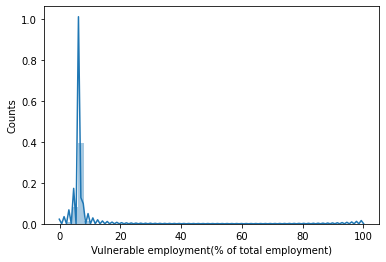

In [ ]:
#plot histogram
ax = sns.distplot(df_imp['Vulnerable employment (% of total employment)'])
ax.set(xlabel ="Vulnerable employment(% of total employment)",ylabel = "Counts" )
plt.show()
#df_imp[]= np.log(df_imp["Vulnerable employment (% of total employment)"])
#rint(crim)

In [ ]:
data = df_imp
from sklearn.preprocessing import PowerTransformer
#instatiate 
pt = PowerTransformer(method='yeo-johnson') 

#Fit the data to the powertransformer
skl_yeojohnson = pt.fit(data)

#Lets get the Lambdas that were found
print (skl_yeojohnson.lambdas_)

calc_lambdas = skl_yeojohnson.lambdas_

#Transform the data 
skl_yeojohnson = pt.transform(data)

#Pass the transformed data into a new dataframe 
df_xt = pd.DataFrame(data=skl_yeojohnson, columns=data.columns)

df_xt.head()

[ 3.76370078e+00  8.43465532e-01  1.78179018e+00  1.37864892e+00
  1.71613838e+00  1.91873462e+00  3.62511453e+00  5.71692099e-01
  2.49879760e+00  1.99735911e+00  8.23932282e-01  1.38319481e+00
  5.27352858e-01  4.72144426e-01  4.40568387e-01  1.28160101e+00
  1.49396186e+00  1.55297424e+00  1.94223223e+00  1.30849343e+00
  7.82696827e-01  1.79787018e+00  5.51437853e-01  3.51832535e-01
  4.38074898e-03  2.18158914e-03  7.90032292e-01  4.95224802e-01
  2.21343298e+00  7.35299483e-01  1.18227970e+00  1.15482253e+00
  6.67743023e-01 -8.47772520e-04  1.13639082e+00  1.60021574e+00
  8.49379284e-01  7.63710343e-01  1.08598179e-01  4.08155661e+00
  3.00991478e+00  5.39030884e-01  1.34606768e+00  9.01275108e-01
  7.38338847e-01  7.68377600e-01  3.79367377e-01  3.35222518e-01
  3.30058857e-01  7.38261933e-01  7.19883476e-01  2.73472864e+00
  2.97438871e+00  4.06299890e-01  6.23978635e-01  4.88987622e-01
 -9.20631983e-01 -7.31386888e-01  7.97673878e-02  2.83395043e-01
 -1.44453932e-01  7.94572

,existence expectancy index,existence expectancy at birth,Gross income per capita,Income Index,Expected years of education (galactic years),Mean years of education (galactic years),Intergalactic Development Index (IDI),Education Index,"Intergalactic Development Index (IDI), Rank",Population using at least basic drinking-water services (%),Population using at least basic sanitation services (%),Gross capital formation (% of GGP),"Population, total (millions)","Population, urban (%)","Mortality rate, under-five (per 1,000 live births)","Mortality rate, infant (per 1,000 live births)",Old age dependency ratio (old age (65 and older) per 100 creatures (ages 15-64)),"Population, ages 15–64 (millions)","Population, ages 65 and older (millions)","Life expectancy at birth, male (galactic years)","Life expectancy at birth, female (galactic years)","Population, under age 5 (millions)",Young age (0-14) dependency ratio (per 100 creatures ages 15-64),"Adolescent birth rate (births per 1,000 female creatures ages 15-19)",Total unemployment rate (female to male ratio),Vulnerable employment (% of total employment),"Unemployment, total (% of labour force)",Employment in agriculture (% of total employment),Labour force participation rate (% ages 15 and older),"Labour force participation rate (% ages 15 and older), female",Employment in services (% of total employment),"Labour force participation rate (% ages 15 and older), male",Employment to population ratio (% ages 15 and older),Jungle area (% of total land area),"Share of employment in nonagriculture, female (% of total employment in nonagriculture)",Youth unemployment rate (female to male ratio),"Unemployment, youth (% ages 15–24)","Mortality rate, female grown up (per 1,000 people)","Mortality rate, male grown up (per 1,000 people)","Infants lacking immunization, red hot disease (% of one-galactic year-olds)","Infants lacking immunization, Combination Vaccine (% of one-galactic year-olds)",Gross galactic product (GGP) per capita,"Gross galactic product (GGP), total","Outer Galaxies direct investment, net inflows (% of GGP)",Exports and imports (% of GGP),Share of seats in senate (% held by female),Natural resource depletion,"Mean years of education, female (galactic years)","Mean years of education, male (galactic years)","Expected years of education, female (galactic years)","Expected years of education, male (galactic years)","Maternal mortality ratio (deaths per 100,000 live births)",Renewable energy consumption (% of total final energy consumption),"Estimated gross galactic income per capita, male","Estimated gross galactic income per capita, female",Rural population with access to electricity (%),Domestic credit provided by financial sector (% of GGP),"Population with at least some secondary education, female (% ages 25 and older)","Population with at least some secondary education, male (% ages 25 and older)",Gross fixed capital formation (% of GGP),"Remittances, inflows (% of GGP)",Population with at least some secondary education (% ages 25 and older),Intergalactic inbound tourists (thousands),"Gross enrolment ratio, primary (% of primary under-age population)","Respiratory disease incidence (per 100,000 people)",Interstellar phone subscriptions (per 100 people),"Interstellar Data Net users, total (% of population)",Current health expenditure (% of GGP),"Intergalactic Development Index (IDI), female","Intergalactic Development Index (IDI), male",Gender Development Index (GDI),"Intergalactic Development Index (IDI), female, Rank","Intergalactic Development Index (IDI), male, Rank",Adjusted net savings,"Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total",Private galaxy capital flows (% of GGP),Gender Inequality Index (GII)
0,-1.491863,-0.945426,-1.149399,-0.928769,-1.169816,-1.243048,-0.829701,1.134046,-1.115144,-1.252387,1.271580,-2.889311,1.778031,-0.193811,2.006426,1.255202,0.784041,-2.349802,0.597093,0.915838,1.337200,0.506164,-0.497870,-1.718773,-2.200897

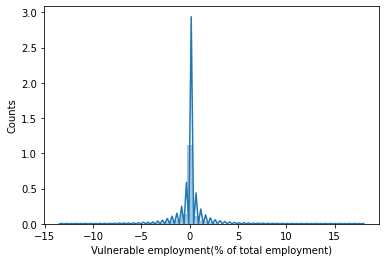

In [ ]:
ax = sns.distplot(df_xt['Vulnerable employment (% of total employment)'])
ax.set(xlabel ="Vulnerable employment(% of total employment)",ylabel = "Counts" )
plt.show()

In [ ]:
df_xt.skew()

existence expectancy index                                                                -0.090592
existence expectancy at birth                                                             -0.020324
Gross income per capita                                                                   -0.045615
Income Index                                                                              -0.031662
Expected years of education (galactic years)                                              -0.056680
Mean years of education (galactic years)                                                  -0.063753
Intergalactic Development Index (IDI)                                                     -0.005634
Education Index                                                                           -0.012245
Intergalactic Development Index (IDI), Rank                                                0.165152
Population using at least basic drinking-water services (%)                               -0.089396


Considerable improvement in skewness.Finally make the pipe line.

In [ ]:
scaler = StandardScaler()
power = PowerTransformer(method='yeo-johnson')
transformer_pipeline = Pipeline(steps=[('s', scaler), ('p', power)])
transformed_data = transformer_pipeline.fit_transform(df_labels)
transformed_df = pd.DataFrame(data = transformed_data,columns=df_imp.columns)

In [ ]:
transformed_df.skew()

existence expectancy index                                                                -0.024296
existence expectancy at birth                                                             -0.032765
Gross income per capita                                                                    0.003066
Income Index                                                                              -0.000107
Expected years of education (galactic years)                                               0.021545
Mean years of education (galactic years)                                                  -0.000498
Intergalactic Development Index (IDI)                                                     -0.010865
Education Index                                                                           -0.003293
Intergalactic Development Index (IDI), Rank                                                0.015684
Population using at least basic drinking-water services (%)                               -0.084792


Using Standard Scaler with Power transformer gave better results.Lastly the objective is to run the all the steps in big data pipeline and runnin all the steps 

In [ ]:
df = pd.read_csv("train.csv")

In [ ]:
df_labels = df.drop("y",axis =1)

In [ ]:
df_labels = df_labels.drop(["galaxy","galactic year"],axis =1)

In [ ]:
seed_value = 0
import random
random.seed(seed_value)

In [ ]:
from sklearn.pipeline import FeatureUnion
#three arrays of data
df_data_cols= list(df_index_attrbiutes)
df_data_per = list(df_percent_attributes)
df_data_rem = list(df_remaining)
#three pipelines
index_pipeline =  Pipeline([
                                ('selector', DataFrameSelector(df_data_cols)), 
                                ('imputer', IterativeImputer( initial_strategy='median',random_state=0)),
                                ("scaler", MinMaxScaler(feature_range = (0,1))),
])

percent_pipeline = Pipeline([        
                                    ('selector', DataFrameSelector(df_data_per)),
                                    ('imputer', IterativeImputer(initial_strategy='median',random_state=0)),
                                    ("scaler", MinMaxScaler(feature_range = (0,100))),                                    
])

remaining_pipeline =  Pipeline([ 
                                ('selector', DataFrameSelector(df_data_rem)),
                                ('imputer', IterativeImputer( initial_strategy='median',random_state=0)),
])
#full pipeline
full_pipeline = FeatureUnion(transformer_list=[
 ("index_pipeline", index_pipeline),
 ("percent_pipeline", percent_pipeline),
 ("remaining_pipeline",remaining_pipeline)
 ])
partial_data_prepared = full_pipeline.fit_transform(df_labels) #passing the whole data of 77 features and 3865 samples.Just dropped the first two columns and last predictor
partial_data_prepared

/usr/local/lib/python3.6/dist-packages/sklearn/impute/_iterative.py:638: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  " reached.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/impute/_iterative.py:638: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  " reached.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/impute/_iterative.py:638: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  " reached.", ConvergenceWarning)


array([[  0.39328754,   0.33091374,   0.34437343, ..., 162.86178897,
        166.4432595 ,  18.2705536 ],
       [  0.57917737,   0.52365165,   0.58379993, ..., 135.0998618 ,
        133.56993801,  19.177926  ],
       [  0.4234992 ,   0.19419042,   0.20375331, ..., 183.93836472,
        187.33388078,  21.15126546],
       ...,
       [  0.79316919,   0.74143138,   0.74041156, ...,  66.49871413,
        112.8870354 ,  28.15485939],
       [  0.69787193,   0.36981125,   0.48169729, ..., 182.2490788 ,
        175.4089534 ,  38.9631569 ],
       [  0.78934231,   0.85593068,   0.93621374, ...,  57.20415467,
         75.43402928,  23.33758667]])

In [ ]:
partial_data_prepared_df = pd.DataFrame(data = partial_data_prepared,columns = df_labels.columns)

In [ ]:
tranformer_pipeline = Pipeline([
                                ('StandardScaler',  StandardScaler()), 
                                ('Powertransformer', PowerTransformer(method='yeo-johnson')), 
                                ])
Full_data_prepared = tranformer_pipeline.fit_transform(partial_data_prepared_df)

In [ ]:
Full_data_prepared_df = pd.DataFrame(data = Full_data_prepared, columns = df_labels.columns)

In [ ]:
Full_data_prepared_df.describe()

,existence expectancy index,existence expectancy at birth,Gross income per capita,Income Index,Expected years of education (galactic years),Mean years of education (galactic years),Intergalactic Development Index (IDI),Education Index,"Intergalactic Development Index (IDI), Rank",Population using at least basic drinking-water services (%),Population using at least basic sanitation services (%),Gross capital formation (% of GGP),"Population, total (millions)","Population, urban (%)","Mortality rate, under-five (per 1,000 live births)","Mortality rate, infant (per 1,000 live births)",Old age dependency ratio (old age (65 and older) per 100 creatures (ages 15-64)),"Population, ages 15–64 (millions)","Population, ages 65 and older (millions)","Life expectancy at birth, male (galactic years)","Life expectancy at birth, female (galactic years)","Population, under age 5 (millions)",Young age (0-14) dependency ratio (per 100 creatures ages 15-64),"Adolescent birth rate (births per 1,000 female creatures ages 15-19)",Total unemployment rate (female to male ratio),Vulnerable employment (% of total employment),"Unemployment, total (% of labour force)",Employment in agriculture (% of total employment),Labour force participation rate (% ages 15 and older),"Labour force participation rate (% ages 15 and older), female",Employment in services (% of total employment),"Labour force participation rate (% ages 15 and older), male",Employment to population ratio (% ages 15 and older),Jungle area (% of total land area),"Share of employment in nonagriculture, female (% of total employment in nonagriculture)",Youth unemployment rate (female to male ratio),"Unemployment, youth (% ages 15–24)","Mortality rate, female grown up (per 1,000 people)","Mortality rate, male grown up (per 1,000 people)","Infants lacking immunization, red hot disease (% of one-galactic year-olds)","Infants lacking immunization, Combination Vaccine (% of one-galactic year-olds)",Gross galactic product (GGP) per capita,"Gross galactic product (GGP), total","Outer Galaxies direct investment, net inflows (% of GGP)",Exports and imports (% of GGP),Share of seats in senate (% held by female),Natural resource depletion,"Mean years of education, female (galactic years)","Mean years of education, male (galactic years)","Expected years of education, female (galactic years)","Expected years of education, male (galactic years)","Maternal mortality ratio (deaths per 100,000 live births)",Renewable energy consumption (% of total final energy consumption),"Estimated gross galactic income per capita, male","Estimated gross galactic income per capita, female",Rural population with access to electricity (%),Domestic credit provided by financial sector (% of GGP),"Population with at least some secondary education, female (% ages 25 and older)","Population with at least some secondary education, male (% ages 25 and older)",Gross fixed capital formation (% of GGP),"Remittances, inflows (% of GGP)",Population with at least some secondary education (% ages 25 and older),Intergalactic inbound tourists (thousands),"Gross enrolment ratio, primary (% of primary under-age population)","Respiratory disease incidence (per 100,000 people)",Interstellar phone subscriptions (per 100 people),"Interstellar Data Net users, total (% of population)",Current health expenditure (% of GGP),"Intergalactic Development Index (IDI), female","Intergalactic Development Index (IDI), male",Gender Development Index (GDI),"Intergalactic Development Index (IDI), female, Rank","Intergalactic Development Index (IDI), male, Rank",Adjusted net savings,"Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total",Private galaxy capital flows (% of GGP),Gender Inequality Index (GII)
count,3.865000e+03,3.865000e+03,3.865000e+03,3.865000e+03,3.865000e+03,3.865000e+03,3.865000e+03,3.865000e+03,3.865000e+03,3.865000e+03,3.865000e+03,3.865000e+03,3.865000e+03,3.865000e+03,3.865000e+03,3.865000e+03,3.865000e+03,3.865000e+03,3

In [ ]:
Full_data_prepared_df.shape

(3865, 77)

In [ ]:
Full_data_prepared_df.head()

,existence expectancy index,existence expectancy at birth,Gross income per capita,Income Index,Expected years of education (galactic years),Mean years of education (galactic years),Intergalactic Development Index (IDI),Education Index,"Intergalactic Development Index (IDI), Rank",Population using at least basic drinking-water services (%),Population using at least basic sanitation services (%),Gross capital formation (% of GGP),"Population, total (millions)","Population, urban (%)","Mortality rate, under-five (per 1,000 live births)","Mortality rate, infant (per 1,000 live births)",Old age dependency ratio (old age (65 and older) per 100 creatures (ages 15-64)),"Population, ages 15–64 (millions)","Population, ages 65 and older (millions)","Life expectancy at birth, male (galactic years)","Life expectancy at birth, female (galactic years)","Population, under age 5 (millions)",Young age (0-14) dependency ratio (per 100 creatures ages 15-64),"Adolescent birth rate (births per 1,000 female creatures ages 15-19)",Total unemployment rate (female to male ratio),Vulnerable employment (% of total employment),"Unemployment, total (% of labour force)",Employment in agriculture (% of total employment),Labour force participation rate (% ages 15 and older),"Labour force participation rate (% ages 15 and older), female",Employment in services (% of total employment),"Labour force participation rate (% ages 15 and older), male",Employment to population ratio (% ages 15 and older),Jungle area (% of total land area),"Share of employment in nonagriculture, female (% of total employment in nonagriculture)",Youth unemployment rate (female to male ratio),"Unemployment, youth (% ages 15–24)","Mortality rate, female grown up (per 1,000 people)","Mortality rate, male grown up (per 1,000 people)","Infants lacking immunization, red hot disease (% of one-galactic year-olds)","Infants lacking immunization, Combination Vaccine (% of one-galactic year-olds)",Gross galactic product (GGP) per capita,"Gross galactic product (GGP), total","Outer Galaxies direct investment, net inflows (% of GGP)",Exports and imports (% of GGP),Share of seats in senate (% held by female),Natural resource depletion,"Mean years of education, female (galactic years)","Mean years of education, male (galactic years)","Expected years of education, female (galactic years)","Expected years of education, male (galactic years)","Maternal mortality ratio (deaths per 100,000 live births)",Renewable energy consumption (% of total final energy consumption),"Estimated gross galactic income per capita, male","Estimated gross galactic income per capita, female",Rural population with access to electricity (%),Domestic credit provided by financial sector (% of GGP),"Population with at least some secondary education, female (% ages 25 and older)","Population with at least some secondary education, male (% ages 25 and older)",Gross fixed capital formation (% of GGP),"Remittances, inflows (% of GGP)",Population with at least some secondary education (% ages 25 and older),Intergalactic inbound tourists (thousands),"Gross enrolment ratio, primary (% of primary under-age population)","Respiratory disease incidence (per 100,000 people)",Interstellar phone subscriptions (per 100 people),"Interstellar Data Net users, total (% of population)",Current health expenditure (% of GGP),"Intergalactic Development Index (IDI), female","Intergalactic Development Index (IDI), male",Gender Development Index (GDI),"Intergalactic Development Index (IDI), female, Rank","Intergalactic Development Index (IDI), male, Rank",Adjusted net savings,"Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total",Private galaxy capital flows (% of GGP),Gender Inequality Index (GII)
0,-1.393157,-0.920873,-1.091145,-0.897490,-1.109641,-1.172697,-0.799858,1.088925,-0.983282,-1.113160,1.174572,-3.005865,1.586403,-0.113040,1.728045,1.045569,0.662923,-2.119331,0.492261,0.760851,1.262573,0.438845,-0.409595,-1.777975,-2.216735

In [ ]:
#joining predictor with preprocessed data
Full_data_prepared_df["y"] = df_predictor.values

In [ ]:
Full_data_prepared_df.head()

,existence expectancy index,existence expectancy at birth,Gross income per capita,Income Index,Expected years of education (galactic years),Mean years of education (galactic years),Intergalactic Development Index (IDI),Education Index,"Intergalactic Development Index (IDI), Rank",Population using at least basic drinking-water services (%),Population using at least basic sanitation services (%),Gross capital formation (% of GGP),"Population, total (millions)","Population, urban (%)","Mortality rate, under-five (per 1,000 live births)","Mortality rate, infant (per 1,000 live births)",Old age dependency ratio (old age (65 and older) per 100 creatures (ages 15-64)),"Population, ages 15–64 (millions)","Population, ages 65 and older (millions)","Life expectancy at birth, male (galactic years)","Life expectancy at birth, female (galactic years)","Population, under age 5 (millions)",Young age (0-14) dependency ratio (per 100 creatures ages 15-64),"Adolescent birth rate (births per 1,000 female creatures ages 15-19)",Total unemployment rate (female to male ratio),Vulnerable employment (% of total employment),"Unemployment, total (% of labour force)",Employment in agriculture (% of total employment),Labour force participation rate (% ages 15 and older),"Labour force participation rate (% ages 15 and older), female",Employment in services (% of total employment),"Labour force participation rate (% ages 15 and older), male",Employment to population ratio (% ages 15 and older),Jungle area (% of total land area),"Share of employment in nonagriculture, female (% of total employment in nonagriculture)",Youth unemployment rate (female to male ratio),"Unemployment, youth (% ages 15–24)","Mortality rate, female grown up (per 1,000 people)","Mortality rate, male grown up (per 1,000 people)","Infants lacking immunization, red hot disease (% of one-galactic year-olds)","Infants lacking immunization, Combination Vaccine (% of one-galactic year-olds)",Gross galactic product (GGP) per capita,"Gross galactic product (GGP), total","Outer Galaxies direct investment, net inflows (% of GGP)",Exports and imports (% of GGP),Share of seats in senate (% held by female),Natural resource depletion,"Mean years of education, female (galactic years)","Mean years of education, male (galactic years)","Expected years of education, female (galactic years)","Expected years of education, male (galactic years)","Maternal mortality ratio (deaths per 100,000 live births)",Renewable energy consumption (% of total final energy consumption),"Estimated gross galactic income per capita, male","Estimated gross galactic income per capita, female",Rural population with access to electricity (%),Domestic credit provided by financial sector (% of GGP),"Population with at least some secondary education, female (% ages 25 and older)","Population with at least some secondary education, male (% ages 25 and older)",Gross fixed capital formation (% of GGP),"Remittances, inflows (% of GGP)",Population with at least some secondary education (% ages 25 and older),Intergalactic inbound tourists (thousands),"Gross enrolment ratio, primary (% of primary under-age population)","Respiratory disease incidence (per 100,000 people)",Interstellar phone subscriptions (per 100 people),"Interstellar Data Net users, total (% of population)",Current health expenditure (% of GGP),"Intergalactic Development Index (IDI), female","Intergalactic Development Index (IDI), male",Gender Development Index (GDI),"Intergalactic Development Index (IDI), female, Rank","Intergalactic Development Index (IDI), male, Rank",Adjusted net savings,"Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total",Private galaxy capital flows (% of GGP),Gender Inequality Index (GII),y
0,-1.393157,-0.920873,-1.091145,-0.897490,-1.109641,-1.172697,-0.799858,1.088925,-0.983282,-1.113160,1.174572,-3.005865,1.586403,-0.113040,1.728045,1.045569,0.662923,-2.119331,0.492261,0.760851,1.262573,0.438845,-0.409595,-1.777975,-2.2167

In [ ]:
Full_data_prepared_df.shape

(3865, 78)

Before data Preprocess

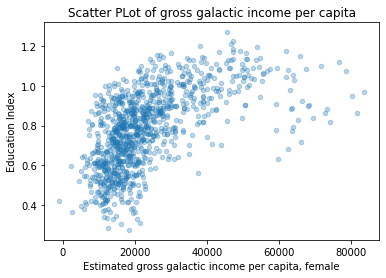

In [ ]:
df.plot(kind = "scatter",x = "Estimated gross galactic income per capita, female", y ="Education Index",title = "Scatter PLot of gross galactic income per capita",alpha =0.3)

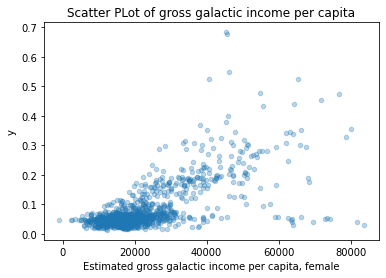

In [ ]:
df.plot(kind = "scatter",x = "Estimated gross galactic income per capita, female", y ="y",title = "Scatter PLot of gross galactic income per capita",alpha =0.3)

After Data Preprocess

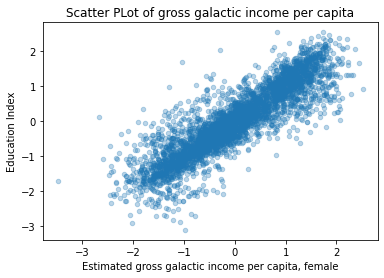

In [ ]:
Full_data_prepared_df.plot(kind = "scatter",x = "Estimated gross galactic income per capita, female", y ="Education Index",title = "Scatter PLot of gross galactic income per capita",alpha =0.3)

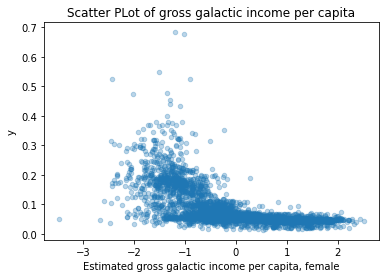

In [ ]:
Full_data_prepared_df.plot(kind = "scatter",x = "Estimated gross galactic income per capita, female", y ="y",title = "Scatter PLot of gross galactic income per capita",alpha =0.3)

In [ ]:
Full_data_prepared_df.skew()

existence expectancy index                                                                -0.024309
existence expectancy at birth                                                              0.000438
Gross income per capita                                                                   -0.005995
Income Index                                                                              -0.000797
Expected years of education (galactic years)                                              -0.005419
Mean years of education (galactic years)                                                  -0.009027
Intergalactic Development Index (IDI)                                                     -0.033384
Education Index                                                                           -0.020464
Intergalactic Development Index (IDI), Rank                                                0.288642
Population using at least basic drinking-water services (%)                                0.054888


In [ ]:
profile = ProfileReport(df_final_full, title ="After Data Preprocess",minimal=True)
profile.to_notebook_iframe()

In [ ]:
profile.to_file("Preprocess report.html")

In [ ]:
#saving the updated frame
from google.colab import files
Full_data_prepared_df.to_csv('Preprocessed_train.csv')
files.download('Preprocessed_train.csv')

Preprocessing the test data

In [ ]:
test_data = pd.read_csv("test.csv")

In [ ]:
test_data = test_data.drop(["galactic year","galaxy"],axis =1)


In [ ]:
test_data.shape

(890, 77)

In [ ]:
#removing neg values from the
cols= ["Population, total (millions)","Population, ages 15–64 (millions)","Population, ages 65 and older (millions)","Population, under age 5 (millions)","Employment in agriculture (% of total employment)","Infants lacking immunization, Combination Vaccine (% of one-galactic year-olds)","Gross galactic product (GGP), total","Gross income per capita","Renewable energy consumption (% of total final energy consumption)","Natural resource depletion","Estimated gross galactic income per capita, female","Remittances, inflows (% of GGP)","Intergalactic inbound tourists (thousands)","Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total","Domestic credit provided by financial sector (% of GGP)"]
test_data[cols] = test_data[test_data[cols] > 0][cols]

In [ ]:
test_data_transform = full_pipeline.transform(test_data)
test_data_transform_df = pd.DataFrame(data = test_data_transform, columns = test_data.columns) 
full_data_transform = tranformer_pipeline.transform(test_data_transform_df)
full_data_test_df = pd.DataFrame(data = full_data_transform, columns = test_data.columns)

In [ ]:
full_data_test_df.describe()

,existence expectancy index,existence expectancy at birth,Gross income per capita,Income Index,Expected years of education (galactic years),Mean years of education (galactic years),Intergalactic Development Index (IDI),Education Index,"Intergalactic Development Index (IDI), Rank",Population using at least basic drinking-water services (%),Population using at least basic sanitation services (%),Gross capital formation (% of GGP),"Population, total (millions)","Population, urban (%)","Mortality rate, under-five (per 1,000 live births)","Mortality rate, infant (per 1,000 live births)",Old age dependency ratio (old age (65 and older) per 100 creatures (ages 15-64)),"Population, ages 15–64 (millions)","Population, ages 65 and older (millions)","Life expectancy at birth, male (galactic years)","Life expectancy at birth, female (galactic years)","Population, under age 5 (millions)",Young age (0-14) dependency ratio (per 100 creatures ages 15-64),"Adolescent birth rate (births per 1,000 female creatures ages 15-19)",Total unemployment rate (female to male ratio),Vulnerable employment (% of total employment),"Unemployment, total (% of labour force)",Employment in agriculture (% of total employment),Labour force participation rate (% ages 15 and older),"Labour force participation rate (% ages 15 and older), female",Employment in services (% of total employment),"Labour force participation rate (% ages 15 and older), male",Employment to population ratio (% ages 15 and older),Jungle area (% of total land area),"Share of employment in nonagriculture, female (% of total employment in nonagriculture)",Youth unemployment rate (female to male ratio),"Unemployment, youth (% ages 15–24)","Mortality rate, female grown up (per 1,000 people)","Mortality rate, male grown up (per 1,000 people)","Infants lacking immunization, red hot disease (% of one-galactic year-olds)","Infants lacking immunization, Combination Vaccine (% of one-galactic year-olds)",Gross galactic product (GGP) per capita,"Gross galactic product (GGP), total","Outer Galaxies direct investment, net inflows (% of GGP)",Exports and imports (% of GGP),Share of seats in senate (% held by female),Natural resource depletion,"Mean years of education, female (galactic years)","Mean years of education, male (galactic years)","Expected years of education, female (galactic years)","Expected years of education, male (galactic years)","Maternal mortality ratio (deaths per 100,000 live births)",Renewable energy consumption (% of total final energy consumption),"Estimated gross galactic income per capita, male","Estimated gross galactic income per capita, female",Rural population with access to electricity (%),Domestic credit provided by financial sector (% of GGP),"Population with at least some secondary education, female (% ages 25 and older)","Population with at least some secondary education, male (% ages 25 and older)",Gross fixed capital formation (% of GGP),"Remittances, inflows (% of GGP)",Population with at least some secondary education (% ages 25 and older),Intergalactic inbound tourists (thousands),"Gross enrolment ratio, primary (% of primary under-age population)","Respiratory disease incidence (per 100,000 people)",Interstellar phone subscriptions (per 100 people),"Interstellar Data Net users, total (% of population)",Current health expenditure (% of GGP),"Intergalactic Development Index (IDI), female","Intergalactic Development Index (IDI), male",Gender Development Index (GDI),"Intergalactic Development Index (IDI), female, Rank","Intergalactic Development Index (IDI), male, Rank",Adjusted net savings,"Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total",Private galaxy capital flows (% of GGP),Gender Inequality Index (GII)
count,890.000000,890.000000,890.000000,890.000000,890.000000,890.000000,890.000000,890.000000,890.000000,890.000000,890.000000,890.000000,890.000000,890.000000,890.000000,890.000000,890.000000,890.000000,890.000000,890.000000,890.000000,890.

In [ ]:
#saving the updated frame
from google.colab import files
full_data_test_df.to_csv('Preprocessed_test.csv')
files.download('Preprocessed_test.csv')

Applying PCA and Visualizing results



In [ ]:
df = pd.read_csv("Preprocessed_train .csv")
df_labels = df.drop(["Unnamed: 0","y"],axis=1)
df_predictor = df.iloc[:,-1]
print("The shape of label data is {}".format(df_labels.shape))
print("The shape of predictor is {}".format(df_predictor.shape))

The shape of label data is (3865, 77)
The shape of predictor is (3865,)


In [ ]:
df_labels.head()

,existence expectancy index,existence expectancy at birth,Gross income per capita,Income Index,Expected years of education (galactic years),Mean years of education (galactic years),Intergalactic Development Index (IDI),Education Index,"Intergalactic Development Index (IDI), Rank",Population using at least basic drinking-water services (%),Population using at least basic sanitation services (%),Gross capital formation (% of GGP),"Population, total (millions)","Population, urban (%)","Mortality rate, under-five (per 1,000 live births)","Mortality rate, infant (per 1,000 live births)",Old age dependency ratio (old age (65 and older) per 100 creatures (ages 15-64)),"Population, ages 15–64 (millions)","Population, ages 65 and older (millions)","Life expectancy at birth, male (galactic years)","Life expectancy at birth, female (galactic years)","Population, under age 5 (millions)",Young age (0-14) dependency ratio (per 100 creatures ages 15-64),"Adolescent birth rate (births per 1,000 female creatures ages 15-19)",Total unemployment rate (female to male ratio),Vulnerable employment (% of total employment),"Unemployment, total (% of labour force)",Employment in agriculture (% of total employment),Labour force participation rate (% ages 15 and older),"Labour force participation rate (% ages 15 and older), female",Employment in services (% of total employment),"Labour force participation rate (% ages 15 and older), male",Employment to population ratio (% ages 15 and older),Jungle area (% of total land area),"Share of employment in nonagriculture, female (% of total employment in nonagriculture)",Youth unemployment rate (female to male ratio),"Unemployment, youth (% ages 15–24)","Mortality rate, female grown up (per 1,000 people)","Mortality rate, male grown up (per 1,000 people)","Infants lacking immunization, red hot disease (% of one-galactic year-olds)","Infants lacking immunization, Combination Vaccine (% of one-galactic year-olds)",Gross galactic product (GGP) per capita,"Gross galactic product (GGP), total","Outer Galaxies direct investment, net inflows (% of GGP)",Exports and imports (% of GGP),Share of seats in senate (% held by female),Natural resource depletion,"Mean years of education, female (galactic years)","Mean years of education, male (galactic years)","Expected years of education, female (galactic years)","Expected years of education, male (galactic years)","Maternal mortality ratio (deaths per 100,000 live births)",Renewable energy consumption (% of total final energy consumption),"Estimated gross galactic income per capita, male","Estimated gross galactic income per capita, female",Rural population with access to electricity (%),Domestic credit provided by financial sector (% of GGP),"Population with at least some secondary education, female (% ages 25 and older)","Population with at least some secondary education, male (% ages 25 and older)",Gross fixed capital formation (% of GGP),"Remittances, inflows (% of GGP)",Population with at least some secondary education (% ages 25 and older),Intergalactic inbound tourists (thousands),"Gross enrolment ratio, primary (% of primary under-age population)","Respiratory disease incidence (per 100,000 people)",Interstellar phone subscriptions (per 100 people),"Interstellar Data Net users, total (% of population)",Current health expenditure (% of GGP),"Intergalactic Development Index (IDI), female","Intergalactic Development Index (IDI), male",Gender Development Index (GDI),"Intergalactic Development Index (IDI), female, Rank","Intergalactic Development Index (IDI), male, Rank",Adjusted net savings,"Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total",Private galaxy capital flows (% of GGP),Gender Inequality Index (GII)
0,-1.393157,-0.920873,-1.091145,-0.897490,-1.109641,-1.172697,-0.799858,1.088925,-0.983282,-1.113160,1.174572,-3.005865,1.586403,-0.113040,1.728045,1.045569,0.662923,-2.119331,0.492261,0.760851,1.262573,0.438845,-0.409595,-1.777975,-2.216735

In [ ]:
pca = PCA(n_components=2)
pca.fit(df_labels)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [ ]:
# transform data onto the first two principal components
X_pca = pca.transform(df_labels)
print("Original shape:{}".format(df_labels.shape))
print("Original shape:{}".format(X_pca.shape))

Original shape:(3865, 77)
Original shape:(3865, 2)


In [ ]:
ratio = pca.explained_variance_ratio_
print("Explained Variation per principal component: {}".format(ratio))


Explained Variation per principal component: [0.45756925 0.06224844]


In [ ]:
PCA_df = pd.DataFrame(data=X_pca,columns=['Principal Component - 1','Principal Component - 2'])
PCA_df.head()

,Principal Component - 1,Principal Component - 2
0,7.748954,1.163169
1,2.925873,-0.403399
2,11.459493,2.675822
3,9.558008,0.430917
4,-7.170188,-0.504052


[]

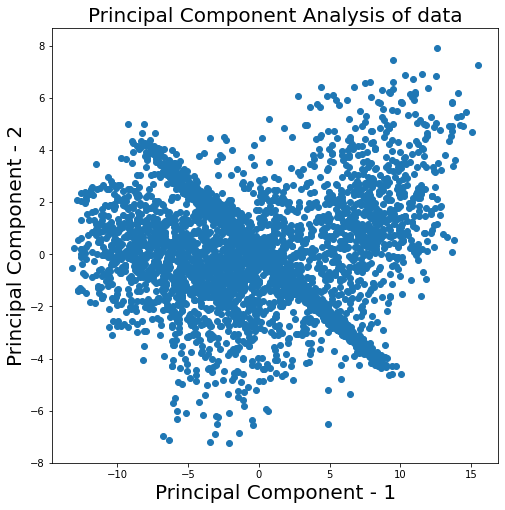

In [ ]:
#plotting the components
fig = plt.figure(figsize = (8,8))
plt.scatter(PCA_df["Principal Component - 1"],PCA_df["Principal Component - 2"])
plt.xlabel('Principal Component - 1',fontsize=20)
plt.ylabel('Principal Component - 2',fontsize=20)
plt.title("Principal Component Analysis of data",fontsize=20)
plt.plot()

[ 45.76  51.98  56.89  61.36  64.95  67.89  70.71  72.87  74.67  76.15
  77.52  78.83  80.09  81.21  82.3   83.29  84.23  85.05  85.85  86.62
  87.35  88.07  88.76  89.43  90.06  90.65  91.19  91.7   92.19  92.66
  93.11  93.56  93.96  94.3   94.62  94.93  95.23  95.5   95.76  96.
  96.23  96.46  96.67  96.88  97.07  97.24  97.4   97.55  97.7   97.84
  97.97  98.1   98.23  98.35  98.47  98.58  98.69  98.8   98.9   99.
  99.09  99.18  99.26  99.34  99.41  99.48  99.55  99.61  99.67  99.73
  99.78  99.83  99.88  99.92  99.96 100.   100.03]


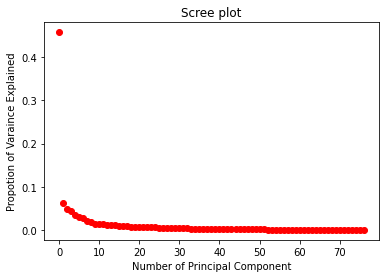

In [ ]:
#visualizing on all data for Explained variance
pca = PCA()
pca.fit(df_labels)
var = pca.explained_variance_ratio_
var1=np.cumsum(np.round(var, decimals=4)*100)
print(var1)
plt.ylabel("Propotion of Varaince Explained")
plt.xlabel("Number of Principal Component")
plt.title("Scree plot")
plt.plot(var,"ro")


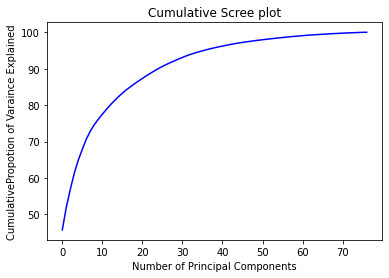

In [ ]:
var1=np.cumsum(np.round(var, decimals=4)*100)
plt.ylabel("CumulativePropotion of Varaince Explained")
plt.xlabel("Number of Principal Components")
plt.title("Cumulative Scree plot")
plt.plot(var1,"b")

95 % of cumulative propotion Variance can be preserved in only 36 principal components,reducing data dimensionality to half

**Modeling**


STRATEGY

1.   Split data randomly on train (60%),validate (20%) and test (20%) 
2.   Tree Based Models with and without Data Preprocessing
1.   Neural Networks









In [ ]:
#with preprocessing
df_preprocessed = pd.read_csv("Preprocessed_train .csv")
X_pp = df_preprocessed.drop(["Unnamed: 0","y"],axis=1)
y = df_preprocessed.iloc[:,-1]
print(X_pp.shape)
x_pp_train,x_pp_test,y_pp_train,y_pp_test = train_test_split(X_pp,y,test_size = 0.2,random_state = 0)
print(x_pp_train.shape)
print(x_pp_test.shape)


(3865, 77)
(3092, 77)
(773, 77)


In [ ]:
#without preprocessing
df = pd.read_csv("train.csv")
X = df.drop(["galactic year","galaxy","y"],axis=1) 
print(X.shape)
x_train,x_test,y_train,y_test = train_test_split(X,y,test_size = 0.2,random_state = 0)

(3865, 77)


In [ ]:
#writing function for evaluation of scores
def display_scores(scores):
  print("Scores:", scores)
  print("Mean:", scores.mean())
  print("Standard deviation:", scores.std())

In [ ]:
#applying Random Forest Regressor without Preprocessed
pipe = make_pipeline(IterativeImputer(),RandomForestRegressor(n_estimators=100,random_state =0))
pipe.fit(x_train,y_train)  
print("Train score: {:.2f}".format(pipe.score(x_train, y_train))) 
print("Test score: {:.2f}".format(pipe.score(x_test, y_test)))

/usr/local/lib/python3.6/dist-packages/sklearn/impute/_iterative.py:638: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  " reached.", ConvergenceWarning)


Train score: 0.97
Test score: 0.81


In [ ]:
scores = cross_val_score(pipe,x_train,y_train,scoring="neg_mean_squared_error", cv=5)
rmse_scores = np.sqrt(-scores)
display_scores(rmse_scores)

/usr/local/lib/python3.6/dist-packages/sklearn/impute/_iterative.py:638: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  " reached.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/impute/_iterative.py:638: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  " reached.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/impute/_iterative.py:638: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  " reached.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/impute/_iterative.py:638: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  " reached.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/impute/_iterative.py:638: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  " reached.", ConvergenceWarning)


Scores: [0.02658761 0.02646693 0.02691474 0.02656188 0.03125744]
Mean: 0.027557719647304024
Standard deviation: 0.0018560161167344737


Applying Random Forest Regressor with cross validation= 5 on preprocessed data

In [ ]:
forest = RandomForestRegressor(n_estimators=100,random_state =0)
scores = cross_val_score(forest, x_pp_train, y_pp_train,scoring="neg_mean_squared_error", cv=5)
rmse_scores = np.sqrt(-scores)
display_scores(rmse_scores)

Scores: [0.02705669 0.02666218 0.02647921 0.02670332 0.03061431]
Mean: 0.027503140669640113
Standard deviation: 0.001566782419188106


In [ ]:
forest.fit(x_pp_train,y_pp_train)
print("Accuracy on training set: {:.3f}".format(forest.score(x_pp_train, y_pp_train)))
print("Accuracy on test set: {:.3f}".format(forest.score(x_pp_test, y_pp_test)))


Accuracy on training set: 0.973
Accuracy on test set: 0.804


Shows that model is severly overfitting(High Variance) but preprocessed data is slightly better and can give better results

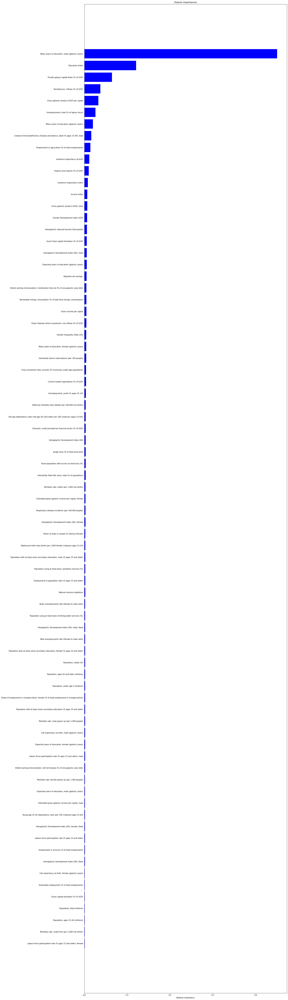

In [ ]:
#Seeing the Feature Importance by Mean Decrease in Impurity (MDI)
features = x_pp_train.columns
importances = forest.feature_importances_
indices = np.argsort(importances)
plt.figure(figsize=(20,100))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

Applying Gradient Boosting Regressor

In [ ]:
gbr = GradientBoostingRegressor(random_state=0)
scores = cross_val_score(gbr, x_pp_train, y_pp_train,scoring="neg_mean_squared_error", cv=5)
rmse_scores = np.sqrt(-scores)
display_scores(rmse_scores)

Scores: [0.02786697 0.0265044  0.02758791 0.02736363 0.0302768 ]
Mean: 0.027919943847334632
Standard deviation: 0.0012634117174391548


In [ ]:
gbr.fit(x_pp_train,y_pp_train)
print("Accuracy on training set: {:.3f}".format(gbr.score(x_pp_train, y_pp_train)))
print("Accuracy on test set: {:.3f}".format(gbr.score(x_pp_test, y_pp_test)))


Accuracy on training set: 0.908
Accuracy on test set: 0.830


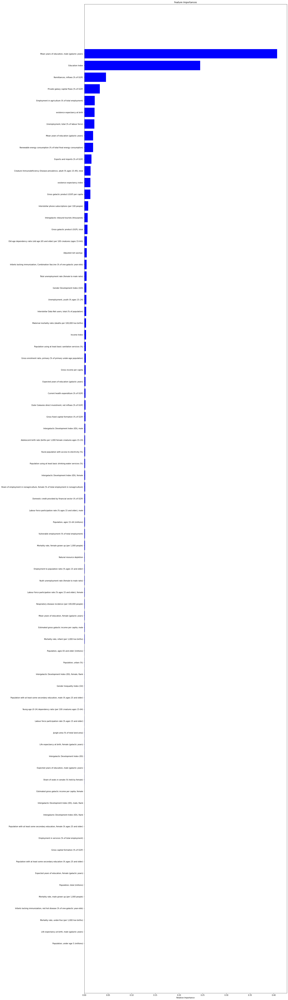

In [ ]:
#Seeing the Feature Importance by Mean Decrease in Impurity (MDI)
features = x_pp_train.columns
importances = gbr.feature_importances_
indices = np.argsort(importances)
plt.figure(figsize=(20,100))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

Applying Light GBM

In [ ]:
lgbm = LGBMRegressor(random_state=0)
scores = cross_val_score(lgbm, x_pp_train, y_pp_train,scoring="neg_mean_squared_error", cv=5)
rmse_scores = np.sqrt(-scores)
display_scores(rmse_scores)

Scores: [0.02776229 0.02802227 0.02691553 0.02640712 0.03029016]
Mean: 0.02787947579217831
Standard deviation: 0.0013373509652813275


In [ ]:
#tuning
from sklearn.model_selection import GridSearchCV
param_grid = {'n_estimators': [100, 500, 1000,],
              'max_depth': [-2,-1,5,7],
              'num_leaves' : [10,100,500,],
              'learning_rate' : [0.001,0.01,0.1],
}
gridsearch = GridSearchCV(LGBMRegressor(),param_grid,cv =5,scoring = "neg_root_mean_squared_error",n_jobs =-1)
gridsearch.fit(x_pp_train,y_pp_train)
best_params = gridsearch.best_params_
model = gridsearch.best_estimator_
score = gridsearch.best_score_
rmse_scores = (-score)
#for item in grid.grid_scores_:
    #print ("\t%s %s %s" % ('\tGRIDSCORES\t',  "R" , item))
#print ('%s\tHP\t%s\t%f' % ("R" , str(best_params) ,abs(score)))
print(best_params)
print(rmse_scores)
print(model)

/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


{'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100, 'num_leaves': 100}
0.027569516314034415
LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=5,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=100, objective=None,
              random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)


In [ ]:
from sklearn.metrics import mean_squared_error


lgbm = LGBMRegressor(random_state=0,learning_rate= 0.1, max_depth= 4, n_estimators = 100, num_leaves= 30,min_data_in_leaf=10,max_bin = 100,lambda_l1 = 0.001,lambda_l2 = 0.001,feature_fraction = 0.8,bagging_fraction=0.6)
lgbm.fit(x_pp_train,y_pp_train)
print("Accuracy on training set: {:.3f}".format(lgbm.score(x_pp_train, y_pp_train)))
print("Accuracy on test set: {:.3f}".format(lgbm.score(x_pp_test, y_pp_test)))
y_pred = lgbm.predict(x_pp_test)
y_pred_train = lgbm.predict(x_pp_train)
print("RMSE on train :{:.3f}".format(mean_squared_error(y_pp_train, y_pred_train, squared=False)))
print("RMSE on test :{:.3f}".format(mean_squared_error(y_pp_test, y_pred, squared=False)))

Accuracy on training set: 0.937
Accuracy on test set: 0.840
RMSE on train :0.015
RMSE on test :0.028


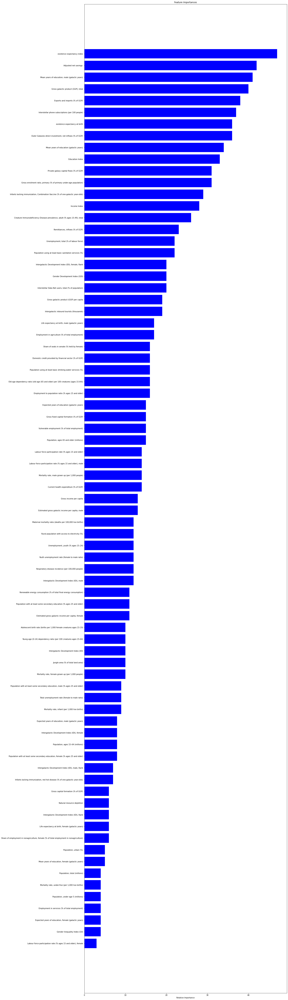

In [ ]:
#Seeing the Feature Importance by Mean Decrease in Impurity (MDI)
features = x_pp_train.columns
importances = lgbm.feature_importances_
indices = np.argsort(importances)
plt.figure(figsize=(20,100))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

Making a model from top 10 attributes from LGBM

In [ ]:
X = X_pp[["existence expectancy at birth","Education Index","Gross galactic product (GGP), total","Outer Galaxies direct investment, net inflows (% of GGP)","existence expectancy index","Mean years of education, male (galactic years)","Income Index","Interstellar Data Net users, total (% of population)","Interstellar phone subscriptions (per 100 people)","Adjusted net savings "]]
#random split
x_train,x_test,y_train,y_test = train_test_split(X,y,test_size = 0.2,random_state = 0)
lgbm = LGBMRegressor(random_state=0,learning_rate= 0.1, max_depth= 5, n_estimators = 100, num_leaves= 100)
lgbm.fit(x_train,y_train)
print("R2 on training set: {:.3f}".format(lgbm.score(x_train, y_train)))
print("R2 on test set: {:.3f}".format(lgbm.score(x_test, y_test)))
y_pred = lgbm.predict(x_test)
y_pred_train = lgbm.predict(x_train)
print("RMSE on train :{:.3f}".format(mean_squared_error(y_train, y_pred_train, squared=False)))
print("RMSE on test :{:.3f}".format(mean_squared_error(y_test, y_pred, squared=False)))

R2 on training set: 0.905
R2 on test set: 0.699
RMSE on train :0.019
RMSE on test :0.039


In [ ]:
#predicting on test data
test_data = pd.read_csv("Preprocessed_test.csv")
test_data = test_data.drop("Unnamed: 0",axis =1)
#predicting model on test data
prediction = lgbm.predict(test_data)
prediction_df = pd.DataFrame(data = prediction)
#saving predictions to csv file
prediction_df.to_csv("lightgbm.csv")

Interesting that Feature importance of LGBM is completely different from Gradient Boosting and Random Forest

Applying Extra Trees Regressor

Now applying Xtreme Gradient Boosting Machine

In [ ]:
from xgboost import XGBRegressor
xgbr = XGBRegressor(random_state = 0)
scores = cross_val_score(xgbr, x_pp_train, y_pp_train,scoring="neg_mean_squared_error", cv=5)
rmse_scores = np.sqrt(-scores)
display_scores(rmse_scores)

[19:19:29] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:19:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:19:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:19:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:19:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Scores: [0.02800973 0.02692626 0.02763924 0.02630974 0.03023372]
Mean: 0.02782373633953824
Standard deviation: 0.00133972369154392


Applying Catboost Regressor

In [ ]:
from catboost import CatBoostRegressor
cbr = CatBoostRegressor(random_state = 0)
scores = cross_val_score(cbr, x_pp_train, y_pp_train,scoring="neg_mean_squared_error", cv=5)
rmse_scores = np.sqrt(-scores)
display_scores(rmse_scores)

Streaming output truncated to the last 5000 lines.
8:	learn: 0.0475850	total: 256ms	remaining: 28.2s
9:	learn: 0.0463714	total: 278ms	remaining: 27.5s
10:	learn: 0.0451762	total: 300ms	remaining: 27s
11:	learn: 0.0441288	total: 330ms	remaining: 27.2s
12:	learn: 0.0431007	total: 352ms	remaining: 26.7s
13:	learn: 0.0421431	total: 373ms	remaining: 26.3s
14:	learn: 0.0412146	total: 395ms	remaining: 26s
15:	learn: 0.0403594	total: 420ms	remaining: 25.8s
16:	learn: 0.0395330	total: 442ms	remaining: 25.5s
17:	learn: 0.0387111	total: 463ms	remaining: 25.3s
18:	learn: 0.0379691	total: 485ms	remaining: 25.1s
19:	learn: 0.0372647	total: 508ms	remaining: 24.9s
20:	learn: 0.0365863	total: 530ms	remaining: 24.7s
21:	learn: 0.0359492	total: 552ms	remaining: 24.5s
22:	learn: 0.0353523	total: 574ms	remaining: 24.4s
23:	learn: 0.0347792	total: 597ms	remaining: 24.3s
24:	learn: 0.0341992	total: 619ms	remaining: 24.1s
25:	learn: 0.0336919	total: 644ms	remaining: 24.1s
26:	learn: 0.0331665	total: 666ms	rem

CAT boost Regressor and LGBM regressor had best performance 

**Applying Neural Network**

In [ ]:
#with preprocessing
df_preprocessed = pd.read_csv("Preprocessed_train .csv")
X = df_preprocessed.drop(["Unnamed: 0","y"],axis=1)
y = df_preprocessed.iloc[:,-1]
print("Shape of whole data is {}".format(X.shape))
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.2,random_state = 0)
print("Shape of training data is {}".format(X_train.shape))
print("Shape of testing data is {}".format(X_test.shape))

Shape of whole data is (3865, 77)
Shape of training data is (3092, 77)
Shape of testing data is (773, 77)


In [ ]:
#validating my approach
x_val = X_train[:600]
partial_x_train = X_train[600:]
y_val = y_train[:600]
partial_y_train = y_train[600:]

In [ ]:
import tensorflow as tf
#defining model structure
def build_model():
  model = models.Sequential()
  model.add(layers.Dense(32,activation = "relu",input_shape = (X_train.shape[1],)))
  model.add(layers.Dense(32,activation = "relu"))
  model.add(layers.Dense(32,activation = "relu"))
  model.add(layers.Dense(1))
  model.compile(optimizer = "rmsprop",loss = "mse",metrics=[tf.keras.metrics.RootMeanSquaredError()])
  return model

In [ ]:
#fitting model
model = build_model()
num_epochs = 200
history = model.fit(partial_x_train, 
                    partial_y_train,
                    validation_data=(x_val, y_val),
                    epochs=num_epochs, 
                    batch_size=10, 
                    verbose=1)

Train on 2492 samples, validate on 600 samples
Epoch 1/200
2492/2492 [==============================] - 1s 463us/step - loss: 0.0098 - root_mean_squared_error: 0.1293 - val_loss: 0.0044 - val_root_mean_squared_error: 0.0961
Epoch 2/200
2492/2492 [==============================] - 1s 399us/step - loss: 0.0024 - root_mean_squared_error: 0.0839 - val_loss: 0.0023 - val_root_mean_squared_error: 0.0756
Epoch 3/200
2492/2492 [==============================] - 1s 428us/step - loss: 0.0016 - root_mean_squared_error: 0.0701 - val_loss: 0.0017 - val_root_mean_squared_error: 0.0658
Epoch 4/200
2492/2492 [==============================] - 1s 408us/step - loss: 0.0013 - root_mean_squared_error: 0.0624 - val_loss: 0.0018 - val_root_mean_squared_error: 0.0598
Epoch 5/200
2492/2492 [==============================] - 1s 406us/step - loss: 0.0011 - root_mean_squared_error: 0.0576 - val_loss: 0.0016 - val_root_mean_squared_error: 0.0557
Epoch 6/200
2492/2492 [==============================] - 1s 409us/st

In [ ]:
model.summary()

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_26 (Dense)             (None, 32)                2496      
_________________________________________________________________
dense_27 (Dense)             (None, 32)                1056      
_________________________________________________________________
dense_28 (Dense)             (None, 32)                1056      
_________________________________________________________________
dense_29 (Dense)             (None, 1)                 33        
Total params: 4,641
Trainable params: 4,641
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history.history.keys()

dict_keys(['val_loss', 'val_root_mean_squared_error', 'loss', 'root_mean_squared_error'])

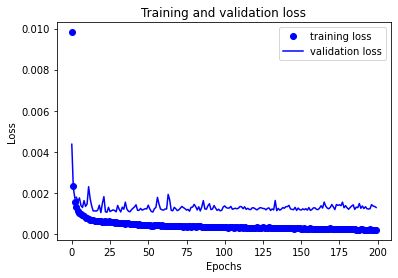

In [ ]:
plt.plot(history.history['loss'] ,'bo')
plt.plot(history.history['val_loss'],'b',)
plt.title('Training and validation loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['training loss', 'validation loss'], loc='upper right')
plt.show()

This shows overfitting right from the start

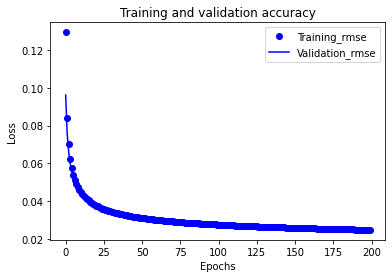

In [ ]:
plt.plot(history.history['root_mean_squared_error'],"bo")
plt.plot(history.history['val_root_mean_squared_error'],"b")
plt.title('Training and validation accuracy')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['Training_rmse', 'Validation_rmse'], loc='best')
plt.show()


Applying Standard Scaler to make convergence faster

In [ ]:
sc_X = StandardScaler()
X_train = sc_X.fit_transform(X_train)
X_test = sc_X.transform(X_test)

X_train = pd.DataFrame(X_train)
X_test = pd.DataFrame(X_test)
X_train.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76
0,0.569894,-1.707544,-0.519480,0.515699,-0.331677,-0.345571,-0.114002,0.100652,-0.218015,-0.198605,0.121792,-0.248334,0.205437,0.128382,0.209281,-0.336842,-0.582702,-0.262287,0.088119,-0.334770,0.005131,-0.545339,0.199473,0.434649,0.475030,-0.061563,-3.179688,-0.145139,-0.167985,-0.397944,-0.212549,-0.215243,0.096384,0.269454,-0.191248,-0.438919,-0.626815,-0.723130,-0.134585,0.145507,-0.064888,-0.456471,-0.441654,0.770735,0.456406,0.465578,0.130161,0.143410,0.085403,0.456678,0.486406,-0.161449,-0.122565,0.461146,0.027834,0.135199,-0.386015,-0.067413,0.159986,0.258516,-0.397911,0.515622,-0.043693,-0.007571,0.447474,0.519458,-0.181075,-0.268831,0.154761,-0.398947,-0.386452,0.470233,0.274858,0.098872,0.327835,0.350050,-0.200399
1,-0.116832,-1.571742,-0.598980,-0.870424,-0.872227,-0.814907,-0.841502,0.758304,-0.094954,-0.077263,0.060101,0.030633,0.026203,0.128820,0.040201,-0.014474,-0.055601,0.016934,-0.048900,-0.018377,0.045932,-0.080996,0.125981,0.109912,0.163195,0.165108,0.118358,0.060337,-0.097664,0.170013,0.059500,0.064518,0.072062,0.144382,0.063818,-0.024244,0.169928,0.103834,0.165830,-0.127141,-0.024521,0.225885,-1.042699,-0.559450,0.396544,0.519652,0.406132,0.398168,-0.302848,0.515493,0.490333,-0.163417,-0.250250,0.541155,0.341873,0.298603,0.367867,0.325256,0.125005,-0.059773,0.242590,0.513292,0.008886,0.308012,-0.573813,-0.573954,-0.806461,-0.870654,0.358268,0.237228,0.233918,0.463593,0.071531,-0.406112,0.339998,0.270680,0.085146
2,0.908934,1.666853,1.358246,0.508793,1.212220,0.897834,0.256070,-1.173223,0.612286,0.743908,2.261417,2.542214,-2.509974,-0.332092,-2.226732,0.671298,-0.316825,1.693795,0.730431,0.533667,0.336893,0.610340,-1.649822,-0.903447,-0.393820,0.203636,-3.393534,-1.698567,1.138061,0.292234,0.097106,1.091552,1.481713,-4.182701,-0.871080,-0.357854,0.819233,-1.937190,-1.758411,1.042699,1.552197,1.813063,0.022059,1.037247,-0.993267,-0.760786,-0.250741,-1.413893,-0.461327,-0.636467,-2.162052,1.037965,1.557083,-2.956770,-0.801468,-1.264384,-0.191231,1.879282,-1.454348,-1.545654,1.547132,0.020978,4.887044,-0.501591,-0.121798,0.608766,0.328028,0.357810,-0.844734,1.851589,1.864928,1.538696,-0.812906,0.783233,-1.265305,-1.339701,2.834701
3,-0.053009,-0.404416,-0.546475,-0.688153,-0.202270,-0.231287,-0.654412,-0.041850,-0.043274,-1.030019,-0.058513,0.537112,0.567477,1.730317,-1.153958,-0.054114,-0.691312,1.276943,0.591046,-0.737236,1.688183,0.681880,1.029539,-0.988936,-0.532300,0.985078,0.755270,-0.036043,-1.256370,-1.357132,-1.056273,0.410841,0.152103,0.542254,-0.312380,1.538372,0.261267,-0.073733,1.638894,-0.815574,0.584363,0.550391,-0.603696,-0.846706,1.110492,-1.260558,-0.286369,-0.115617,-1.240808,0.705494,0.004947,0.042017,-0.794149,-0.522696,1.401813,1.293209,1.818988,1.561733,-0.134888,0.497731,-1.115936,0.268712,-0.487676,-4.400680,0.102230,-0.327314,-0.262340,-0.502185,0.620600,-0.456291,0.026974,0.559052,-0.647063,-0.496658,1.240418,0.911755,0.568276
4,1.334673,1.508998,2.146520,1.265496,1.621242,1.637835,2.121020,-1.683961,-0.032518,1.081995,0.590664,1.488759,-1.625747,0.166384,-1.549435,-0.148293,1.623403,2.593243,-0.576073,0.216466,1.416466,2.382579,-1.624783,-0.777332,-1.339170,-2.803773,1.254352,0.116393,2.330284,1.911834,3.166128,1.659117,0.323917,-0.961305,3.356441,0.133703,3.183388,2.855229,-1.557654,1.974780,1.311610,1.477895,1.583406,1.997229,-1.395857,-0.493197,-1.528609,-1.036679,1.211483,-0.060026,-0.345835,2.547702,1.803506,-1.406041,-1.926099,-1.148192,-0.683907,-0.186721,-1.921787,-1.860346,1.387639,0.316497,0.289749,-3.102381,1.964468,2.192992,1.773184,1.280187,-0.845579,1.249912,1.481355,-2.318891,-2.517201,0.667669,-1.266715,-1.664213,0.487845


In [ ]:
print(X_train.shape)
print(X_test.shape)

(3092, 77)
(773, 77)


In [ ]:
#validating my approach
x_val = X_train[:600]
partial_x_train = X_train[600:]
y_val = y_train[:600]
partial_y_train = y_train[600:]

In [ ]:
import tensorflow as tf
#defining model structure
def build_model():
  model = models.Sequential()
  model.add(layers.Dense(32,activation = "relu",input_shape = (X_train.shape[1],)))
  model.add(layers.Dense(32,activation = "relu"))
  model.add(layers.Dense(32,activation = "relu"))
  model.add(layers.Dense(1))
  model.compile(optimizer = "rmsprop",loss = "mse",metrics=[tf.keras.metrics.RootMeanSquaredError()])
  return model

In [ ]:
#fitting model
model = build_model()
num_epochs = 200
history = model.fit(partial_x_train, 
                    partial_y_train,
                    validation_data=(x_val, y_val),
                    epochs=num_epochs, 
                    batch_size=10, 
                    verbose=1)

Train on 2492 samples, validate on 600 samples
Epoch 1/200
2492/2492 [==============================] - 1s 452us/step - loss: 0.0177 - root_mean_squared_error: 0.1773 - val_loss: 0.0041 - val_root_mean_squared_error: 0.1277
Epoch 2/200
2492/2492 [==============================] - 1s 416us/step - loss: 0.0040 - root_mean_squared_error: 0.1102 - val_loss: 0.0027 - val_root_mean_squared_error: 0.0988
Epoch 3/200
2492/2492 [==============================] - 1s 424us/step - loss: 0.0022 - root_mean_squared_error: 0.0908 - val_loss: 0.0028 - val_root_mean_squared_error: 0.0848
Epoch 4/200
2492/2492 [==============================] - 1s 405us/step - loss: 0.0016 - root_mean_squared_error: 0.0802 - val_loss: 0.0019 - val_root_mean_squared_error: 0.0761
Epoch 5/200
2492/2492 [==============================] - 1s 410us/step - loss: 0.0013 - root_mean_squared_error: 0.0729 - val_loss: 0.0026 - val_root_mean_squared_error: 0.0701
Epoch 6/200
2492/2492 [==============================] - 1s 399us/st

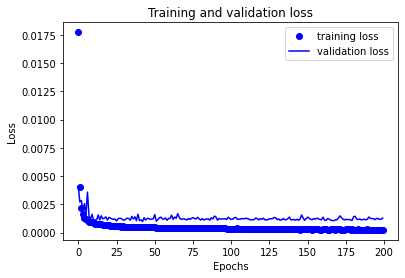

In [ ]:
plt.plot(history.history['loss'] ,'bo')
plt.plot(history.history['val_loss'],'b',)
plt.title('Training and validation loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['training loss', 'validation loss'], loc='upper right')
plt.show()

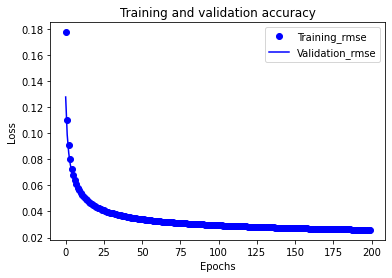

In [ ]:
plt.plot(history.history['root_mean_squared_error'],"bo")
plt.plot(history.history['val_root_mean_squared_error'],"b")
plt.title('Training and validation accuracy')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['Training_rmse', 'Validation_rmse'], loc='best')
plt.show()

Adding L2 weight regularization to the model

In [ ]:
import tensorflow as tf
from keras import regularizers
#defining model structure
def build_model():
  model = models.Sequential()
  model.add(layers.Dense(32,kernel_regularizer=regularizers.l2(0.001),activation = "relu",input_shape = (X_train.shape[1],)))
  model.add(layers.Dense(32,kernel_regularizer=regularizers.l2(0.001),activation = "relu"))
  model.add(layers.Dense(32,kernel_regularizer=regularizers.l2(0.001),activation = "relu"))
  model.add(layers.Dense(1))
  model.compile(optimizer = "rmsprop",loss = "mse",metrics=[tf.keras.metrics.RootMeanSquaredError()])
  return model

In [ ]:
#fitting model
model = build_model()
num_epochs = 200
history = model.fit(partial_x_train, 
                    partial_y_train,
                    validation_data=(x_val, y_val),
                    epochs=num_epochs, 
                    batch_size=10, 
                    verbose=1)

Train on 2492 samples, validate on 600 samples
Epoch 1/200
2492/2492 [==============================] - 1s 499us/step - loss: 0.1195 - root_mean_squared_error: 0.2430 - val_loss: 0.0786 - val_root_mean_squared_error: 0.1499
Epoch 2/200
2492/2492 [==============================] - 1s 427us/step - loss: 0.0464 - root_mean_squared_error: 0.1253 - val_loss: 0.0177 - val_root_mean_squared_error: 0.1084
Epoch 3/200
2492/2492 [==============================] - 1s 446us/step - loss: 0.0075 - root_mean_squared_error: 0.0980 - val_loss: 0.0031 - val_root_mean_squared_error: 0.0900
Epoch 4/200
2492/2492 [==============================] - 1s 428us/step - loss: 0.0022 - root_mean_squared_error: 0.0842 - val_loss: 0.0021 - val_root_mean_squared_error: 0.0795
Epoch 5/200
2492/2492 [==============================] - 1s 439us/step - loss: 0.0015 - root_mean_squared_error: 0.0757 - val_loss: 0.0015 - val_root_mean_squared_error: 0.0724
Epoch 6/200
2492/2492 [==============================] - 1s 424us/st

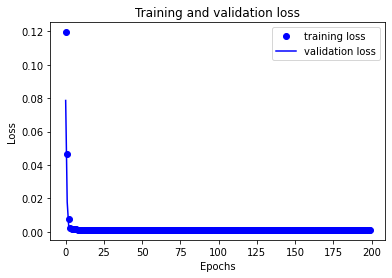

In [ ]:
plt.plot(history.history['loss'] ,'bo')
plt.plot(history.history['val_loss'],'b',)
plt.title('Training and validation loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['training loss', 'validation loss'], loc='upper right')
plt.show()

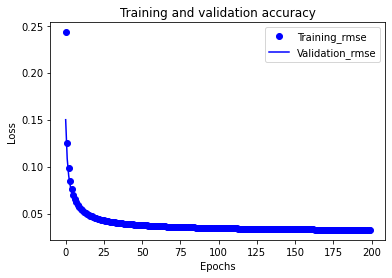

In [ ]:
plt.plot(history.history['root_mean_squared_error'],"bo")
plt.plot(history.history['val_root_mean_squared_error'],"b")
plt.title('Training and validation accuracy')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['Training_rmse', 'Validation_rmse'], loc='best')
plt.show()

The problem is solved but we can add more complexity in network

In [ ]:
#with preprocessing and standardizing
df_preprocessed = pd.read_csv("Preprocessed_train .csv")
X = df_preprocessed.drop(["Unnamed: 0","y"],axis=1)
y = df_preprocessed.iloc[:,-1]
print("Shape of whole data is {}".format(X.shape))
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.2,random_state = 0)
print("Shape of training data is {}".format(X_train.shape))
print("Shape of testing data is {}".format(X_test.shape))

sc_X = StandardScaler()
X_train = sc_X.fit_transform(X_train)
X_test = sc_X.transform(X_test)
X_train = pd.DataFrame(X_train)
X_test = pd.DataFrame(X_test)
X_train.head()

Shape of whole data is (3865, 77)
Shape of training data is (3092, 77)
Shape of testing data is (773, 77)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76
0,0.569894,-1.707544,-0.519480,0.515699,-0.331677,-0.345571,-0.114002,0.100652,-0.218015,-0.198605,0.121792,-0.248334,0.205437,0.128382,0.209281,-0.336842,-0.582702,-0.262287,0.088119,-0.334770,0.005131,-0.545339,0.199473,0.434649,0.475030,-0.061563,-3.179688,-0.145139,-0.167985,-0.397944,-0.212549,-0.215243,0.096384,0.269454,-0.191248,-0.438919,-0.626815,-0.723130,-0.134585,0.145507,-0.064888,-0.456471,-0.441654,0.770735,0.456406,0.465578,0.130161,0.143410,0.085403,0.456678,0.486406,-0.161449,-0.122565,0.461146,0.027834,0.135199,-0.386015,-0.067413,0.159986,0.258516,-0.397911,0.515622,-0.043693,-0.007571,0.447474,0.519458,-0.181075,-0.268831,0.154761,-0.398947,-0.386452,0.470233,0.274858,0.098872,0.327835,0.350050,-0.200399
1,-0.116832,-1.571742,-0.598980,-0.870424,-0.872227,-0.814907,-0.841502,0.758304,-0.094954,-0.077263,0.060101,0.030633,0.026203,0.128820,0.040201,-0.014474,-0.055601,0.016934,-0.048900,-0.018377,0.045932,-0.080996,0.125981,0.109912,0.163195,0.165108,0.118358,0.060337,-0.097664,0.170013,0.059500,0.064518,0.072062,0.144382,0.063818,-0.024244,0.169928,0.103834,0.165830,-0.127141,-0.024521,0.225885,-1.042699,-0.559450,0.396544,0.519652,0.406132,0.398168,-0.302848,0.515493,0.490333,-0.163417,-0.250250,0.541155,0.341873,0.298603,0.367867,0.325256,0.125005,-0.059773,0.242590,0.513292,0.008886,0.308012,-0.573813,-0.573954,-0.806461,-0.870654,0.358268,0.237228,0.233918,0.463593,0.071531,-0.406112,0.339998,0.270680,0.085146
2,0.908934,1.666853,1.358246,0.508793,1.212220,0.897834,0.256070,-1.173223,0.612286,0.743908,2.261417,2.542214,-2.509974,-0.332092,-2.226732,0.671298,-0.316825,1.693795,0.730431,0.533667,0.336893,0.610340,-1.649822,-0.903447,-0.393820,0.203636,-3.393534,-1.698567,1.138061,0.292234,0.097106,1.091552,1.481713,-4.182701,-0.871080,-0.357854,0.819233,-1.937190,-1.758411,1.042699,1.552197,1.813063,0.022059,1.037247,-0.993267,-0.760786,-0.250741,-1.413893,-0.461327,-0.636467,-2.162052,1.037965,1.557083,-2.956770,-0.801468,-1.264384,-0.191231,1.879282,-1.454348,-1.545654,1.547132,0.020978,4.887044,-0.501591,-0.121798,0.608766,0.328028,0.357810,-0.844734,1.851589,1.864928,1.538696,-0.812906,0.783233,-1.265305,-1.339701,2.834701
3,-0.053009,-0.404416,-0.546475,-0.688153,-0.202270,-0.231287,-0.654412,-0.041850,-0.043274,-1.030019,-0.058513,0.537112,0.567477,1.730317,-1.153958,-0.054114,-0.691312,1.276943,0.591046,-0.737236,1.688183,0.681880,1.029539,-0.988936,-0.532300,0.985078,0.755270,-0.036043,-1.256370,-1.357132,-1.056273,0.410841,0.152103,0.542254,-0.312380,1.538372,0.261267,-0.073733,1.638894,-0.815574,0.584363,0.550391,-0.603696,-0.846706,1.110492,-1.260558,-0.286369,-0.115617,-1.240808,0.705494,0.004947,0.042017,-0.794149,-0.522696,1.401813,1.293209,1.818988,1.561733,-0.134888,0.497731,-1.115936,0.268712,-0.487676,-4.400680,0.102230,-0.327314,-0.262340,-0.502185,0.620600,-0.456291,0.026974,0.559052,-0.647063,-0.496658,1.240418,0.911755,0.568276
4,1.334673,1.508998,2.146520,1.265496,1.621242,1.637835,2.121020,-1.683961,-0.032518,1.081995,0.590664,1.488759,-1.625747,0.166384,-1.549435,-0.148293,1.623403,2.593243,-0.576073,0.216466,1.416466,2.382579,-1.624783,-0.777332,-1.339170,-2.803773,1.254352,0.116393,2.330284,1.911834,3.166128,1.659117,0.323917,-0.961305,3.356441,0.133703,3.183388,2.855229,-1.557654,1.974780,1.311610,1.477895,1.583406,1.997229,-1.395857,-0.493197,-1.528609,-1.036679,1.211483,-0.060026,-0.345835,2.547702,1.803506,-1.406041,-1.926099,-1.148192,-0.683907,-0.186721,-1.921787,-1.860346,1.387639,0.316497,0.289749,-3.102381,1.964468,2.192992,1.773184,1.280187,-0.845579,1.249912,1.481355,-2.318891,-2.517201,0.667669,-1.266715,-1.664213,0.487845


In [ ]:
#defining model structure
def build_model():
  model = models.Sequential()
  model.add(layers.Dense(32,kernel_regularizer=regularizers.l2(0.001),activation = "relu",input_shape = (X_train.shape[1],)))
  model.add(layers.Dense(32,kernel_regularizer=regularizers.l2(0.001),activation = "relu"))
  model.add(layers.Dense(16,kernel_regularizer=regularizers.l2(0.001),activation = "relu"))
  model.add(layers.Dense(16,kernel_regularizer=regularizers.l2(0.001),activation = "relu"))
  model.add(layers.Dense(1))
  model.compile(optimizer = "rmsprop",loss = "mse",metrics=[tf.keras.metrics.RootMeanSquaredError()])
  return model

In [ ]:
#fitting model
model = build_model()
num_epochs = 200
history = model.fit(partial_x_train, 
                    partial_y_train,
                    validation_data=(x_val, y_val),
                    epochs=num_epochs, 
                    batch_size=10, 
                    verbose=1)

Train on 2492 samples, validate on 600 samples
Epoch 1/200
2492/2492 [==============================] - 1s 520us/step - loss: 0.0897 - root_mean_squared_error: 0.1543 - val_loss: 0.0293 - val_root_mean_squared_error: 0.0913
Epoch 2/200
2492/2492 [==============================] - 1s 448us/step - loss: 0.0101 - root_mean_squared_error: 0.0765 - val_loss: 0.0034 - val_root_mean_squared_error: 0.0674
Epoch 3/200
2492/2492 [==============================] - 1s 448us/step - loss: 0.0024 - root_mean_squared_error: 0.0621 - val_loss: 0.0021 - val_root_mean_squared_error: 0.0581
Epoch 4/200
2492/2492 [==============================] - 1s 458us/step - loss: 0.0020 - root_mean_squared_error: 0.0552 - val_loss: 0.0019 - val_root_mean_squared_error: 0.0528
Epoch 5/200
2492/2492 [==============================] - 1s 456us/step - loss: 0.0019 - root_mean_squared_error: 0.0510 - val_loss: 0.0018 - val_root_mean_squared_error: 0.0495
Epoch 6/200
2492/2492 [==============================] - 1s 457us/st

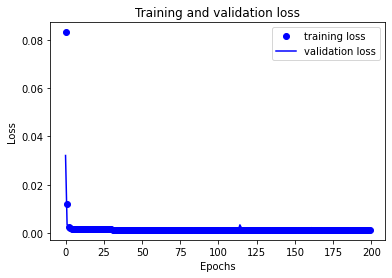

In [ ]:
plt.plot(history.history['loss'] ,'bo')
plt.plot(history.history['val_loss'],'b',)
plt.title('Training and validation loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['training loss', 'validation loss'], loc='upper right')
plt.show()

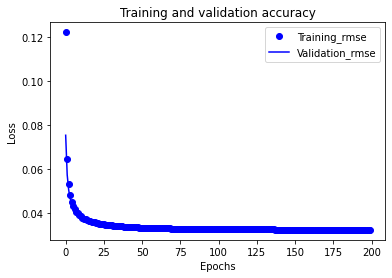

In [ ]:
plt.plot(history.history['root_mean_squared_error'],"bo")
plt.plot(history.history['val_root_mean_squared_error'],"b")
plt.title('Training and validation accuracy')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['Training_rmse', 'Validation_rmse'], loc='best')
plt.show()

In [ ]:
model.save("Hackathon_Neural_Net.h5")

In [ ]:
model = tf.keras.models.load_model('Hackathon_Neural_Net.h5')

RMSE on Test data is 0.04015421936655375
R2 on Test data is 0.6792214006061683


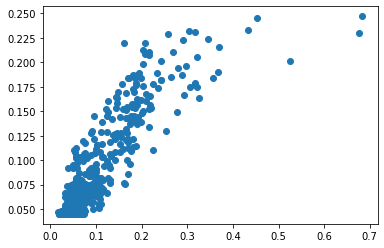

In [ ]:
#predicting on remaining test data
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
y_hat = model.predict(X_test)
Rmse_test_data = mean_squared_error(y_test,y_hat,squared =False)
R2_score = r2_score(y_test,y_hat)
print("RMSE on Test data is {}".format(Rmse_test_data))
print("R2 on Test data is {}".format(R2_score))
#plotting
plt.scatter(y_test,y_hat)
plt.show()



Getting around 0.032 is the lowest NN can get without over fitting but we can train for even more layers and bigger to see where we can go

**Trying same model with different scaler**

In [ ]:
#with preprocessing and standardizing
df_preprocessed = pd.read_csv("Preprocessed_train .csv")
X = df_preprocessed.drop(["Unnamed: 0","y"],axis=1)
y = df_preprocessed.iloc[:,-1]
print("Shape of whole data is {}".format(X.shape))
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.2,random_state = 0)
print("Shape of training data is {}".format(X_train.shape))
print("Shape of testing data is {}".format(X_test.shape))

sc_X = MinMaxScaler()
X_train = sc_X.fit_transform(X_train)
X_test = sc_X.transform(X_test)
X_train = pd.DataFrame(X_train)
X_test = pd.DataFrame(X_test)
X_train.head()

Shape of whole data is (3865, 77)
Shape of training data is (3092, 77)
Shape of testing data is (773, 77)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76
0,0.563289,0.196365,0.392806,0.604397,0.422215,0.406655,0.610592,0.570377,0.206637,0.414646,0.506704,0.420720,0.524428,0.483609,0.633487,0.467106,0.415929,0.426267,0.553769,0.469931,0.457048,0.261092,0.507859,0.585351,0.680174,0.434712,0.150068,0.584603,0.417898,0.508503,0.425419,0.450146,0.448157,0.428324,0.449314,0.356593,0.412050,0.372177,0.575669,0.494282,0.463311,0.506372,0.352424,0.625573,0.408596,0.590412,0.515228,0.519414,0.449390,0.678445,0.706052,0.453695,0.459312,0.588404,0.586308,0.520500,0.394985,0.408970,0.526368,0.541328,0.505237,0.635113,0.494316,0.508768,0.598302,0.556103,0.397967,0.444473,0.475544,0.497539,0.607504,0.566793,0.505971,0.475282,0.395040,0.400090,0.612089
1,0.447704,0.221807,0.378307,0.343138,0.313612,0.317954,0.533746,0.686995,0.215348,0.434787,0.501798,0.462498,0.498772,0.483652,0.610260,0.502966,0.471145,0.464660,0.540640,0.505360,0.461893,0.296391,0.500081,0.539895,0.645822,0.445331,0.483893,0.614902,0.429744,0.556274,0.463391,0.486297,0.446402,0.421025,0.484306,0.384817,0.518939,0.436118,0.601549,0.486192,0.470127,0.612158,0.261591,0.371852,0.401538,0.595179,0.558131,0.561499,0.397425,0.682591,0.706292,0.453358,0.437831,0.595739,0.638820,0.546670,0.452419,0.433121,0.520459,0.493998,0.609564,0.634917,0.499135,0.538606,0.399159,0.371145,0.301456,0.358524,0.504324,0.598306,0.689248,0.566216,0.477709,0.395427,0.396547,0.390567,0.634232
2,0.620354,0.828533,0.735252,0.603095,0.732401,0.641651,0.649683,0.344487,0.265411,0.571086,0.676834,0.838632,0.135732,0.438373,0.298850,0.579249,0.443780,0.695228,0.615318,0.567177,0.496444,0.348946,0.312130,0.398048,0.584462,0.447136,0.128423,0.355541,0.637902,0.566554,0.468640,0.619014,0.548130,0.168493,0.356050,0.362111,0.606048,0.278306,0.435782,0.520903,0.736347,0.858220,0.422503,0.676408,0.237673,0.482292,0.456013,0.262156,0.376213,0.601397,0.543955,0.659188,0.741894,0.275049,0.447639,0.296354,0.409824,0.528705,0.253657,0.273046,0.822051,0.593553,0.946269,0.462058,0.487298,0.571210,0.476534,0.533968,0.334195,0.854015,0.904160,0.659498,0.354778,0.583502,0.197667,0.197341,0.847450
3,0.458446,0.440496,0.387883,0.377493,0.448214,0.428254,0.553508,0.545108,0.219006,0.276647,0.492367,0.538348,0.576252,0.640979,0.446218,0.498556,0.404551,0.637911,0.601962,0.424864,0.656908,0.354384,0.595713,0.386082,0.569207,0.483745,0.548361,0.600690,0.234559,0.427826,0.307655,0.531050,0.452178,0.444245,0.432696,0.491173,0.531193,0.422388,0.728448,0.465765,0.572934,0.662467,0.327935,0.317061,0.485715,0.438230,0.450474,0.476625,0.271883,0.695983,0.676584,0.488554,0.346326,0.498205,0.816055,0.705958,0.562973,0.509173,0.476555,0.576899,0.388284,0.614368,0.453620,0.093400,0.530982,0.412866,0.385426,0.411147,0.541423,0.488456,0.661980,0.574499,0.377829,0.381109,0.508099,0.467488,0.671697
4,0.692012,0.798960,0.879012,0.745720,0.814578,0.781506,0.846677,0.253920,0.219768,0.627202,0.543986,0.680867,0.262304,0.487342,0.391891,0.488080,0.647027,0.818903,0.490124,0.531657,0.624642,0.483669,0.314780,0.415702,0.480322,0.306247,0.598877,0.623167,0.838733,0.702778,0.897002,0.692357,0.464577,0.356496,0.936011,0.395568,0.923217,0.648855,0.453076,0.548560,0.695725,0.806259,0.658463,0.859516,0.190206,0.505883,0.257354,0.324470,0.600110,0.642026,0.655115,0.917848,0.783351,0.417220,0.259586,0.314962,0.372290,0.401631,0.174692,0.226251,0.796072,0.618383,0.524879,0.216154,0.894104,0.839192,0.699555,0.665698,0.334076,0.758711,0.853618,0.324794,0.117890,0.565227,0.197492,0.158404,0.665460


In [ ]:
#validating my approach
x_val = X_train[:600]
partial_x_train = X_train[600:]
y_val = y_train[:600]
partial_y_train = y_train[600:]

In [ ]:
#defining model structure
def build_model():
  model = models.Sequential()
  model.add(layers.Dense(32,kernel_regularizer=regularizers.l2(0.001),activation = "relu",input_shape = (X_train.shape[1],)))
  model.add(layers.Dense(32,kernel_regularizer=regularizers.l2(0.001),activation = "relu"))
  model.add(layers.Dense(16,kernel_regularizer=regularizers.l2(0.001),activation = "relu"))
  model.add(layers.Dense(16,kernel_regularizer=regularizers.l2(0.001),activation = "relu"))
  model.add(layers.Dense(1))
  model.compile(optimizer = "rmsprop",loss = "mse",metrics=[tf.keras.metrics.RootMeanSquaredError()])
  return model

In [ ]:
#fitting model
model = build_model()
num_epochs = 200
history = model.fit(partial_x_train, 
                    partial_y_train,
                    validation_data=(x_val, y_val),
                    epochs=num_epochs, 
                    batch_size=10, 
                    verbose=1)

Train on 2492 samples, validate on 600 samples
Epoch 1/200
2492/2492 [==============================] - 1s 368us/step - loss: 0.0566 - root_mean_squared_error: 0.0558 - val_loss: 0.0203 - val_root_mean_squared_error: 0.0470
Epoch 2/200
2492/2492 [==============================] - 1s 327us/step - loss: 0.0118 - root_mean_squared_error: 0.0445 - val_loss: 0.0065 - val_root_mean_squared_error: 0.0436
Epoch 3/200
2492/2492 [==============================] - 1s 401us/step - loss: 0.0050 - root_mean_squared_error: 0.0428 - val_loss: 0.0045 - val_root_mean_squared_error: 0.0425
Epoch 4/200
2492/2492 [==============================] - 1s 407us/step - loss: 0.0032 - root_mean_squared_error: 0.0422 - val_loss: 0.0027 - val_root_mean_squared_error: 0.0417
Epoch 5/200
2492/2492 [==============================] - 1s 314us/step - loss: 0.0028 - root_mean_squared_error: 0.0413 - val_loss: 0.0024 - val_root_mean_squared_error: 0.0410
Epoch 6/200
2492/2492 [==============================] - 1s 325us/st

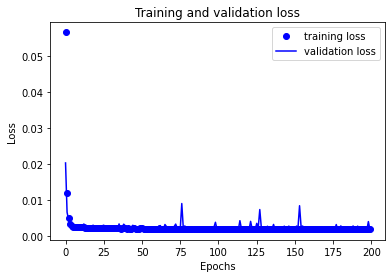

In [ ]:
plt.plot(history.history['loss'] ,'bo')
plt.plot(history.history['val_loss'],'b',)
plt.title('Training and validation loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['training loss', 'validation loss'], loc='upper right')
plt.show()

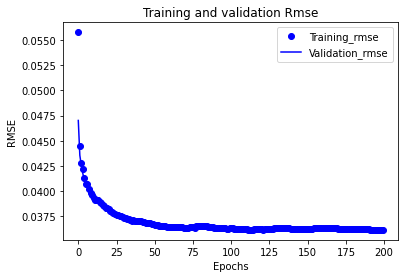

In [ ]:
plt.plot(history.history['root_mean_squared_error'],"bo")
plt.plot(history.history['val_root_mean_squared_error'],"b")
plt.title('Training and validation Rmse')
plt.ylabel('RMSE')
plt.xlabel('Epochs')
plt.legend(['Training_rmse', 'Validation_rmse'], loc='best')
plt.show()

Results by standard scaler are better
Lets try reducing complexity and reduce features by PCA and apply on NN

In [ ]:
#with preprocessing and standardizing
df_preprocessed = pd.read_csv("Preprocessed_train .csv")
X = df_preprocessed.drop(["Unnamed: 0","y"],axis=1)
y = df_preprocessed.iloc[:,-1] 

sc_X = StandardScaler()
X_scaled = sc_X.fit_transform(X)

pca = PCA(0.95)
pca.fit(X_scaled)
X_pca = pca.transform(X_scaled)
X = pd.DataFrame(data = X_pca)
X.head()


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36
0,7.748954,1.163172,-0.752682,-0.215157,0.201639,-0.016548,4.243592,-1.264254,-0.816943,-2.338744,-1.792791,1.494881,-0.542135,-0.542870,-1.121272,-1.185970,0.257639,2.334467,-0.004027,-1.631860,-1.066324,-0.885286,0.725893,0.921236,2.032381,-0.451809,0.498697,0.699557,-0.166137,0.040656,0.627269,0.429862,-0.128643,-0.618297,-0.026997,-0.176939,-0.232245
1,2.925873,-0.403401,0.658478,4.955865,1.866425,1.126635,0.213685,-0.333413,-0.952930,0.258411,0.235141,-1.955470,-0.124505,-0.055280,-0.976483,1.044619,0.650721,0.697715,1.620238,0.781201,1.594434,-1.762128,-0.190714,0.977398,1.871061,-1.005045,0.161448,0.348645,-0.552401,0.610441,0.345742,0.880826,-0.239627,0.381642,-0.396062,0.394880,-0.305224
2,11.459493,2.675822,-2.162039,1.248758,3.593324,0.097876,-3.814386,-1.371765,-1.117448,-0.118727,0.042228,-0.361014,-0.300726,-0.016853,-0.212306,-1.916179,-0.056799,0.320422,-0.126659,-1.718121,2.617490,-0.101736,1.162611,-0.835723,0.295305,-0.938853,-0.147952,0.050299,-0.747230,0.128111,-0.587531,-0.434306,0.412798,-0.030980,-0.235906,-0.380339,-1.029409
3,9.558008,0.430918,-0.381838,-2.193597,2.435440,-2.544101,0.189029,0.819363,0.291430,-0.662925,-0.618155,1.500906,-0.565954,-0.232736,-1.019331,1.139560,0.740372,0.676400,0.350742,-1.869602,2.191317,-0.274038,-0.056500,-0.716763,0.787562,-0.497629,-0.226313,1.174182,-0.729677,-0.659589,0.293362,0.848923,0.514260,0.036423,-0.021622,0.121844,-0.032561
4,-7.170188,-0.504052,2.362660,1.446671,-1.016478,-2.416388,1.100596,0.040440,1.711114,-0.838487,-0.279748,-0.200275,0.068405,1.597523,-0.381553,-0.361257,-0.000080,-0.517573,-0.330519,0.013625,0.440295,-1.155978,0.141293,-0.560289,0.297171,-0.107996,-1.836681,-0.276630,0.746446,0.284436,0.232636,-0.226422,1.271803,-0.507726,-0.149485,0.471959,-0.142544


In [ ]:
#seperating into train and test
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.2,random_state = 0)
print("Shape of training data is {}".format(X_train.shape))
print("Shape of testing data is {}".format(X_test.shape))


Shape of training data is (3092, 37)
Shape of testing data is (773, 37)


In [ ]:
#validating my approach
x_val = X_train[:600]
partial_x_train = X_train[600:]
y_val = y_train[:600]
partial_y_train = y_train[600:]

In [ ]:
#defining model structure
def build_model():
  model = models.Sequential()
  model.add(layers.Dense(16,kernel_regularizer=regularizers.l2(0.001),activation = "relu",input_shape = (X_train.shape[1],)))
  model.add(layers.Dense(16,kernel_regularizer=regularizers.l2(0.001),activation = "relu"))
  model.add(layers.Dense(16,kernel_regularizer=regularizers.l2(0.001),activation = "relu"))
  #model.add(layers.Dense(16,kernel_regularizer=regularizers.l2(0.001),activation = "relu"))
  model.add(layers.Dense(1))
  model.compile(optimizer = "rmsprop",loss = "mse",metrics=[tf.keras.metrics.RootMeanSquaredError()])
  return model

In [ ]:
#fitting model
model = build_model()
num_epochs = 2000
history = model.fit(partial_x_train, 
                    partial_y_train,
                    validation_data=(x_val, y_val),
                    epochs=num_epochs, 
                    batch_size=10, 
                    verbose=1)

Train on 2492 samples, validate on 600 samples
Epoch 1/2000
2492/2492 [==============================] - 1s 328us/step - loss: 0.1034 - root_mean_squared_error: 0.3553 - val_loss: 0.0484 - val_root_mean_squared_error: 0.2224
Epoch 2/2000
2492/2492 [==============================] - 1s 283us/step - loss: 0.0365 - root_mean_squared_error: 0.1850 - val_loss: 0.0250 - val_root_mean_squared_error: 0.1600
Epoch 3/2000
2492/2492 [==============================] - 1s 292us/step - loss: 0.0150 - root_mean_squared_error: 0.1440 - val_loss: 0.0072 - val_root_mean_squared_error: 0.1315
Epoch 4/2000
2492/2492 [==============================] - 1s 305us/step - loss: 0.0044 - root_mean_squared_error: 0.1223 - val_loss: 0.0030 - val_root_mean_squared_error: 0.1146
Epoch 5/2000
2492/2492 [==============================] - 1s 347us/step - loss: 0.0024 - root_mean_squared_error: 0.1085 - val_loss: 0.0020 - val_root_mean_squared_error: 0.1033
Epoch 6/2000
2492/2492 [==============================] - 1s 33

In [ ]:
model.save("Hackathon_PCA_Neurals.h5")

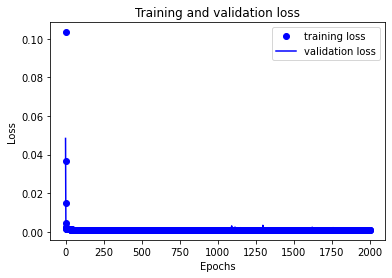

In [ ]:
plt.plot(history.history['loss'] ,'bo')
plt.plot(history.history['val_loss'],'b',)
plt.title('Training and validation loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['training loss', 'validation loss'], loc='upper right')
plt.show()

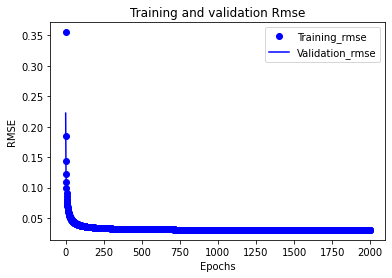

In [ ]:
plt.plot(history.history['root_mean_squared_error'],"bo")
plt.plot(history.history['val_root_mean_squared_error'],"b")
plt.title('Training and validation Rmse')
plt.ylabel('RMSE')
plt.xlabel('Epochs')
plt.legend(['Training_rmse', 'Validation_rmse'], loc='best')
plt.show()

RMSE on Test data is 0.04348277979876159
R2 on Test data is 0.6238356684892423


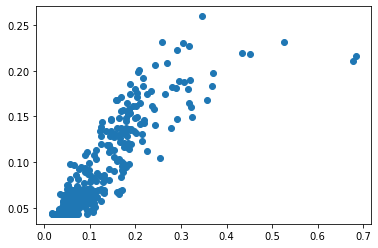

In [ ]:
#predicting on remaining test data
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
y_hat = model.predict(X_test)
Rmse_test_data = mean_squared_error(y_test,y_hat,squared =False)
R2_score = r2_score(y_test,y_hat)
print("RMSE on Test data is {}".format(Rmse_test_data))
print("R2 on Test data is {}".format(R2_score))
#plotting
plt.scatter(y_test,y_hat)
plt.show()


Saving first Predictions on Test Data provided by Hackathon

In [ ]:
#predicting on test data
test_data = pd.read_csv("Preprocessed_test.csv")
test_data = test_data.drop("Unnamed: 0",axis =1)
test_scaled = sc_X.transform(test_data)
test_pca = pca.transform(test_scaled)
test_pca.shape

(890, 37)

In [ ]:
test_pca_df = pd.DataFrame(data = test_pca)
test_pca_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36
0,8.661932,-1.951154,-0.986505,-2.437603,-1.270705,-1.408640,-2.652889,-1.343453,-0.915151,1.036987,0.628687,0.926504,0.855061,0.059364,-0.338591,0.053420,1.053255,-0.720739,-0.660368,0.298498,0.245749,0.445061,-0.456750,-0.289218,0.542827,-0.106785,-0.604837,-0.924018,0.371519,-0.056635,0.061824,-0.358239,0.538955,-0.488613,0.002198,-0.340022,-0.232958
1,12.828149,0.404038,-0.048821,-0.640396,-0.985046,1.869578,0.090826,0.521065,-0.517687,0.315239,0.595725,-0.798432,-0.101218,0.051017,1.367620,-0.137408,-0.450546,0.045585,0.518780,0.147823,0.200798,-0.435866,0.167140,0.049831,-0.460025,-0.071286,-1.145068,-0.284916,0.030441,-1.095407,0.702614,-0.535022,-0.180304,-0.253264,0.141374,0.031790,-0.347443
2,9.876842,1.521442,3.230445,-0.044929,-1.575113,-1.452789,0.169861,1.182374,-0.391448,0.313308,-0.539642,-0.024454,-0.078504,0.089408,0.057337,-0.218952,-0.188170,0.112680,0.025935,-0.072576,-0.131690,-0.293130,0.240446,0.181084,-0.091908,0.227163,0.390675,0.100836,0.046931,0.639877,-0.192434,-0.176261,-0.073545,0.354684,-0.116753,0.043660,0.321862
3,7.727274,1.196840,0.961966,-0.637561,-1.223863,-0.680497,0.532117,1.776526,-0.799425,0.652370,-0.268051,-0.332186,0.021595,-0.284056,0.093362,-0.160941,0.396643,0.079953,-0.036311,-0.114513,0.082605,-0.042527,0.155688,0.022896,-0.004062,-0.016173,-0.349960,-0.323160,-0.121743,0.056805,0.295763,0.106545,0.106170,-0.122297,0.059297,-0.191399,-0.315884
4,10.812960,3.366435,-0.415921,1.402918,-0.275916,-1.355317,-5.743605,0.322595,-1.002800,-1.260813,0.955496,0.188135,-0.682188,-1.552987,0.409651,-0.707953,0.635111,0.983797,-2.622963,1.590561,-0.534782,-0.142150,-0.550549,-1.081783,-1.189681,0.726173,1.244105,0.040128,-0.777728,-0.044283,-0.980751,1.693957,0.794822,0.502613,1.060998,0.556792,-0.339536


In [ ]:
#predicting model on test data
prediction = model.predict(test_pca_df)
prediction_df = pd.DataFrame(data = prediction)
#saving predictions to csv file
prediction_df.to_csv("Neural Network Prediction.csv")